# Identifying a Clustering Structure in Air Quality Index reports in the US between 1980 - 2022

**Names**: 
1. Simon Lizarazo Chaparro
2. Dharshini Sriramlatha
3. Chitra Uppalapati



## 1. Introduction

Air quality is a parameter that refers to the condition of the air in a specific geographical area. Very fine particles can remain suspended in the air for extended periods. These particles, in the context of air quality, are typically pollutants present in the atmosphere and can significantly impact human health and the dynamics of ecosystems. The Air Quality Index (AQI) is a standardized metric created by government agencies to inform the public about the level of pollutants.

This project offers a comprehensive overview of reported AQI values per day across different states in the U.S. from 1980 to 2022. This information can be used to analyze several aspects. First, it enables an understanding of how the clustering structure of air quality reporting for different states changes over time. Second, it assesses the effectiveness of environmental policies in specific regions, determining whether these policies are sufficient to improve air quality after their implementation by evaluating the total number of days throughout the year with healthy or unhealthy AQI. This analysis can be beneficial for the public in making informed decisions about places to live and assist government agencies in implementing policies that can help improve air quality.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
%matplotlib inline
from sklearn.cluster import KMeans, Birch
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn_extra.cluster import KMedoids
from sklearn.manifold import TSNE
from gower import gower_matrix
from scipy.spatial.distance import pdist, squareform
from sklearn.manifold import TSNE

from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering

from kmodes.kprototypes import KPrototypes

from gower import gower_matrix
from sklearn import preprocessing
from scipy.spatial.distance import cdist

In [31]:
def show_silhouette_plots(X,cluster_labels):

    # This package allows us to use "color maps" in our visualizations
    import matplotlib.cm as cm
    
    #How many clusters in your clustering?
    n_clusters=len(np.unique(cluster_labels))    

    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient fcan range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
    

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.show()
    
    return

## 2. Dataset Discussion

The dataset under review contains recorded Air Quality Index (AQI) data at the county level by state, spanning from 1980 to 2022. This dataset, sourced from Kaggle and downloaded on December 5th, 2023, is accessible at Kaggle: Air Quality Index by State 1980-2022 (https://www.kaggle.com/datasets/adampq/air-quality-index-by-state-1980-2022/data). Comprising 2193 rows, the dataset encapsulates 42 years of AQI reports submitted by each state. Each row represents an annual summary of AQI, detailing the total number of days categorized under specific air quality conditions, such as days with unhealthy AQI or days where carbon monoxide (CO) was the predominant pollutant.

Notably, this dataset does not include pollutant concentration levels. While it captures key AQI indicators, other potentially influential variables, such as the total number of rainy days, days with wildfires, or average yearly pollutant concentrations, were not tabulated. However, the absence of these variables does not significantly hinder the understanding of AQI reporting trends over this 20-year period. The dataset provides a comprehensive overview of air quality variations and can serve as a valuable resource for analyzing long-term trends and changes in air quality across different states.


#### Variables to use
- pop_est / Population Estimate per state per year **NO**
- TTL_Cnty / Total Counties per state per year **NO**
- Cnty_Rpt / Number of Counties Reporting **NO**
- Dys_w_AQI / Sum Number of Days with Air Quality Index measured, **YES**
- Dys_NM / Sum Number of Days Not Measured (Calculated) **NO**
- Dys_Abv_Thr / Sum Number of Days above threshold (Moderated) **YES**
- Dys_Blw_Thr / Sum Number of Days below threshold (Moderated)**YES**
- Good Days / Sum Number of Good Days **YES**
- Moderate Days / Sum Number of Moderate Days **YES**
- Unhealthy for Sensitive Groups Days / Sum Number of Unhealthy for Sensitive Groups Days **YES**
- Unhealthy Days / Sum Number of Unhealthy Days **YES**
- Very Unhealthy Days / Sum Number of Very Unhealthy Days **YES**
- Hazardous Days / Sum Number of Hazardous Days **YES**
- Max AQI / Sum Max Air Quality Index **YES**
- 90th Percentile AQI **NO**
- Median AQI **YES**
- Days CO / Sum Number of Days CO was main pollutant **YES**
- Days NO2 / Sum Number of Days NO2 was main pollutant **YES**
- Days Ozone / Sum Number of Days Ozone was main pollutant **YES**
- Days PM2.5 / Sum Number of Days Particulate Matter with diameter of 2.5 micrometers or smaller was main pollutant **YES**
- Days PM10 / Sum Number of Days Particulate Matter with a diameter of 10 micrometers or smaller was main pollutant **YES**


##### **NOTE:** Given that the variables to use are reported as Sum Number of Days over all counties that reported, there will be a normalization in order to obtain the total number of days per year per countie. In that way, for examplein 1980, Alabama had a total of 1382 days where the AQI index was measured in 7 counties, that means there is in average 197 days of the year where AQI was reported per county. It is important to acknowledge the fact that this normalization can include some biased in the sense that it does not account for counties population density or size in geographical area, but it is a way to outweight the effect caused in states where there is higher number of counties that reported any type of data, for example in that same year in California 41 counties measured AQI index with a total of 13728 days, meaning a total of 334 days per county.

In [2]:
df = pd.read_csv('AQI By State 1980-2022.csv')
df.head()


,Geo_Loc,Year,State,Pop_Est,TTL_Cnty,Cnty_Rpt,Dys_w_AQI,Dys_NM,Dys_Blw_Thr,Dys_Abv_Thr,...,Very Unhealthy Days,Hazardous Days,Max AQI,90th Percentile AQI,Median AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10
0,POINT (-86.63186076199969 32.84057112200048),1980,Alabama,3900368,67,7,1382,1180,1169,213,...,8,0,1282,774,314,240,334,808,0,0
1,POINT (-147.72205903599973 64.84507995700051),1980,Alaska,405315,30,4,1184,280,1099,85,...,16,0,586,306,132,732,121,331,0,0
2,POINT (-111.76381127699972 34.865970280000454),1980,Arizona,2737774,15,7,1866,696,1561,305,...,7,0,1078,678,355,721,151,994,0,0
3,POINT (-92.27449074299966 34.74865012400045),1980,Arkansas,2288738,75,1,366,0,320,46,...,1,0,202,115,38,0,29,337,0,0
4,POINT (-120.99999953799971 37.63864012300047),1980,California,23800800,58,41,13728,1278,11221,2507,...,725,4,7869,4771,2215,1763,3685,8280,0,0


In [3]:
df.columns

Index(['Geo_Loc', 'Year', 'State', 'Pop_Est', 'TTL_Cnty', 'Cnty_Rpt',
       'Dys_w_AQI', 'Dys_NM', 'Dys_Blw_Thr', 'Dys_Abv_Thr', 'Good Days',
       'Moderate Days', 'Unhealthy for Sensitive Groups Days',
       'Unhealthy Days', 'Very Unhealthy Days', 'Hazardous Days', 'Max AQI',
       '90th Percentile AQI', 'Median AQI', 'Days CO', 'Days NO2',
       'Days Ozone', 'Days PM2.5', 'Days PM10'],
      dtype='object')

## 3. Dataset Cleaning and Exploration

#### Missing Values

There are no missing values in the dataframe

In [4]:
nan_count = df.isna().sum()
print(nan_count)

Geo_Loc                                0
Year                                   0
State                                  0
Pop_Est                                0
TTL_Cnty                               0
Cnty_Rpt                               0
Dys_w_AQI                              0
Dys_NM                                 0
Dys_Blw_Thr                            0
Dys_Abv_Thr                            0
Good Days                              0
Moderate Days                          0
Unhealthy for Sensitive Groups Days    0
Unhealthy Days                         0
Very Unhealthy Days                    0
Hazardous Days                         0
Max AQI                                0
90th Percentile AQI                    0
Median AQI                             0
Days CO                                0
Days NO2                               0
Days Ozone                             0
Days PM2.5                             0
Days PM10                              0
dtype: int64


#### Outlier Identification

##### Two Variables
Observation of the pair plot, puts in evidence the presence of very few outliers. For example, there are some points in the pair plots that look very far from the rest. For example, high number of days per county for very sensible groups and high number of days per county where AQI was above threshold

##### Three Variables
Observation of the dendogram obtained by using single linkage puts in evidence that there are observations that can be considered as outliers

In [5]:
## Numerical Variables
df = df[df.iloc[:, 5] != 0]

selected_columns = [5] + [6] + list(range(8, 17)) + list(range(19, 24)) 
dfnum = df.iloc[:, selected_columns]
dfnum_divided = dfnum.div(dfnum.iloc[:, 0], axis=0)

# Drop the first column from dfnum_divided
dfnum_divided = dfnum_divided.iloc[:, 1:]

dfnum = dfnum_divided



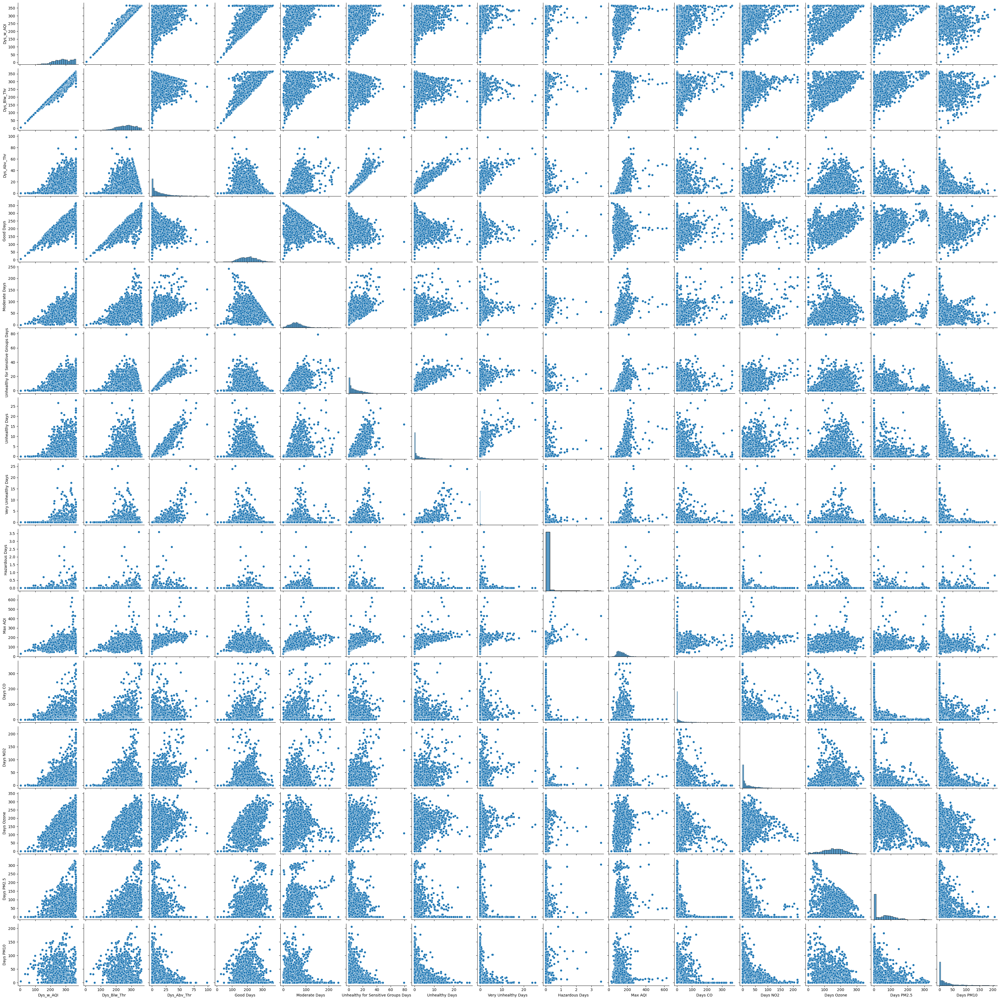

In [6]:
sns.pairplot(dfnum)

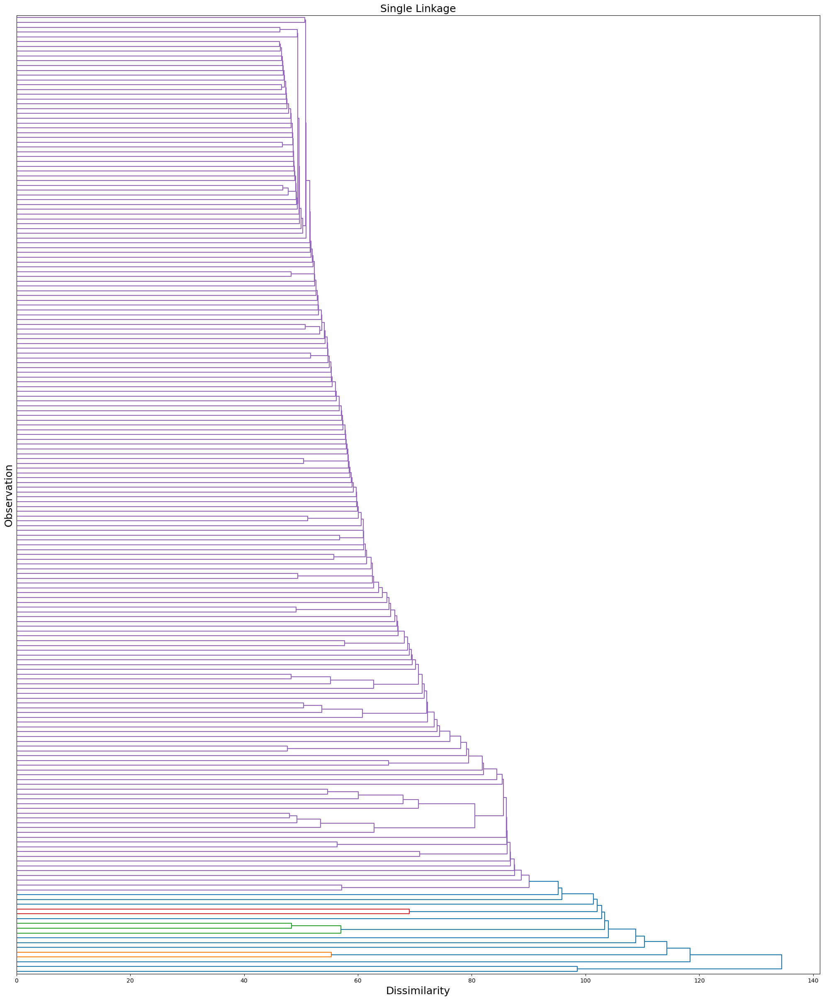

In [7]:
## Three Variables, Single linkage, Hierarchical Clustering
dm = pdist(dfnum, metric = 'euclidean')
link = linkage(dm, method = 'single')
fig, ax = plt.subplots(figsize = (25,30))
d = dendrogram(link, orientation = 'right', ax = ax, truncate_mode = 'lastp', p = 200, no_labels = True)
ax.set_xlabel('Dissimilarity', fontsize = 18)
ax.set_ylabel('Observation', fontsize = 18)
plt.yticks(fontsize = 12)
plt.title('Single Linkage', fontsize = 18)
plt.show()

In [8]:
df2 = pd.concat([df.iloc[:,1:4], dfnum], axis = 1)

hac = AgglomerativeClustering(n_clusters= None, affinity = 'euclidean', linkage = 'single', distance_threshold= 90)

df2['outlier_clust'] = hac.fit_predict(dfnum)

df2 = df2[df2['outlier_clust'] == 0]

df2 = df2.drop(['outlier_clust'], axis = 1)



/Users/simonlizarazo/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


#### Outlier Consideration
When running the single linkage HAC it was possible to observe a set of approximately 20 observations that could be considered as outliers due to the high distance that they present. This observations are dangerous in the sense that they could end up being clustered as singleton clusters and that is something undesired, therefore, it would be reasonable to drop this observation that could result from states where the report habbits are probably higher compared to other states.

#### Noise Consideration and Identification

For noise identification: Calculate the nearest neighbor (2 to 10) to each observation and ploted the distance obtained for each observation. It is possible to observe that there are some noise in the dataset

(2164, 15)


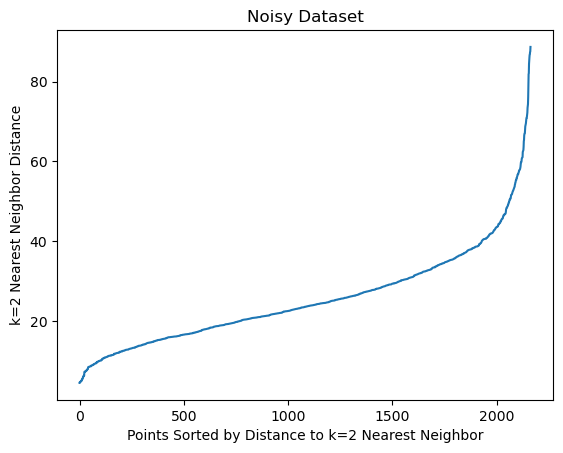

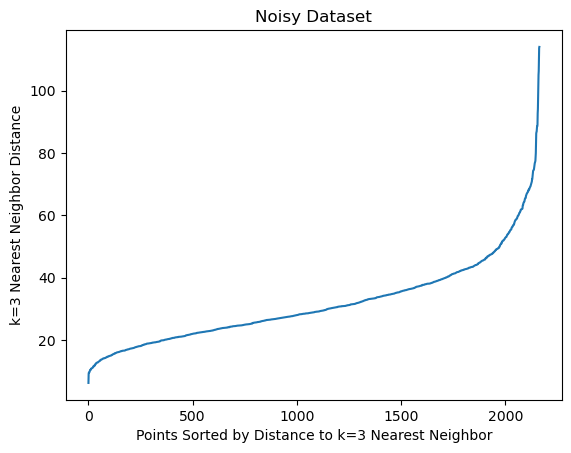

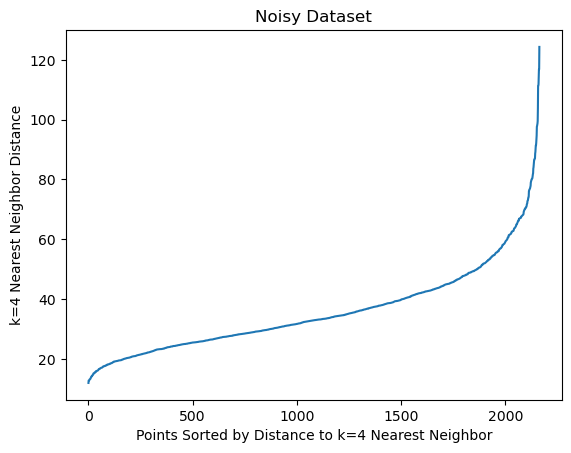

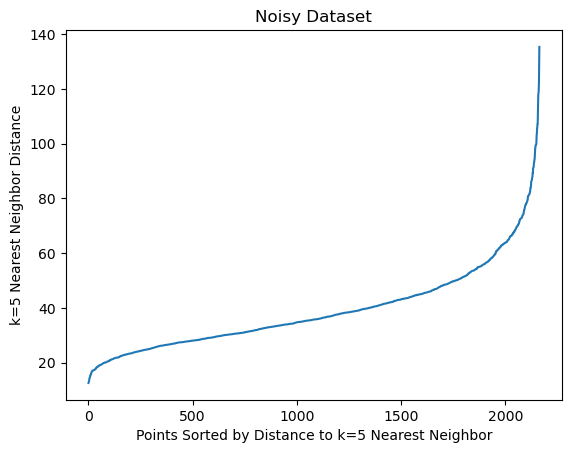

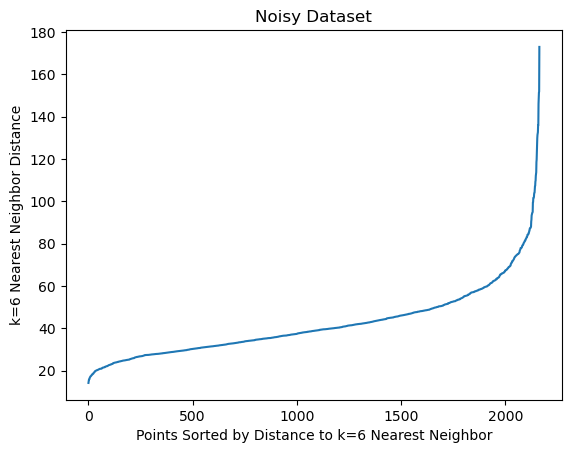

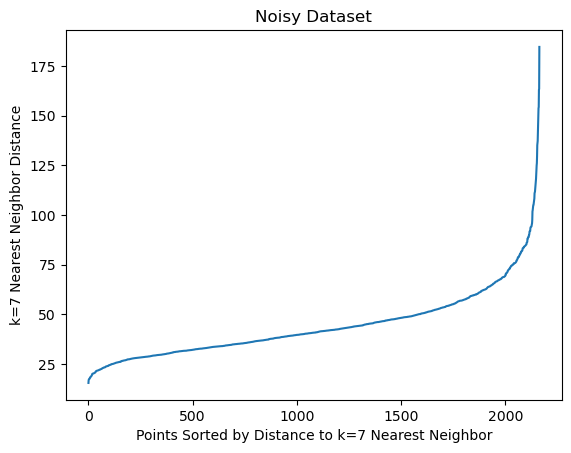

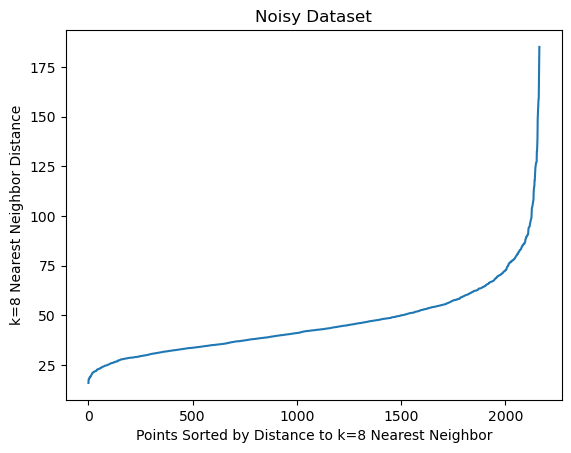

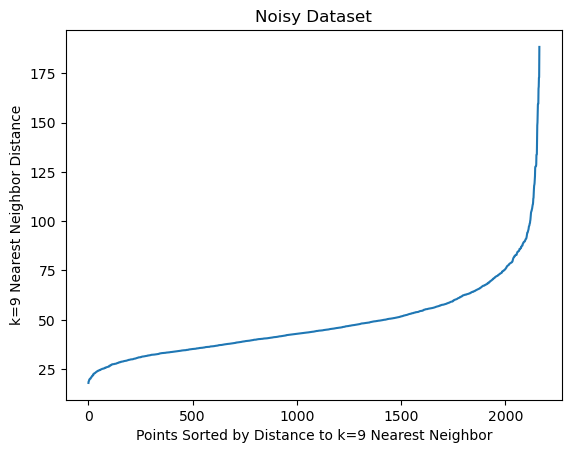

In [9]:
dfnum = df2.iloc[:,3:19]
print(dfnum.shape)
for k in range(2,10):
  nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(dfnum)
  distances, indices = nbrs.kneighbors(dfnum)

  plt.plot(np.sort(distances.T[k-1]))
  plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
  plt.ylabel('k=%s Nearest Neighbor Distance'%k)
  plt.title('Noisy Dataset')
  plt.show()

#### Outlier and Noise Consideration

After removing the outliers, it is possible to observe some noisy observations, which could range approximately around 100 observations. The removal of those observations is not performed given that in subsequent data cleaning and manipulation steps, observations will be collapsed by year and state by considering the median value, circumventing the possible effect of these noisy observations in this aggrupation step.


#### Other Data Cleaning

Given that the goal is to understand changes in the clustering structure over time, the original data frame got split in two, one data frame that has reports from 1980 to 2000 and another data frame that has reports from 2000 to 2022. Each dataframe will be summarized by calculating the average of the states in a period of 20 years

In [10]:
df = df2
df['Bin'] = pd.cut(df['Year'], bins =[1979, 1984, 1989, 1994, 1999, 2004, 2009, 2014, 2019, 2024],
                  labels = ['1980-1984', '1985-1989', '1990-1994', '1995-1999', '2000-2004', '2005-2009', '2010-2014',
                           '2015-2019', '2020-2023'])

df.isna().sum()

Year                                   0
State                                  0
Pop_Est                                0
Dys_w_AQI                              0
Dys_Blw_Thr                            0
Dys_Abv_Thr                            0
Good Days                              0
Moderate Days                          0
Unhealthy for Sensitive Groups Days    0
Unhealthy Days                         0
Very Unhealthy Days                    0
Hazardous Days                         0
Max AQI                                0
Days CO                                0
Days NO2                               0
Days Ozone                             0
Days PM2.5                             0
Days PM10                              0
Bin                                    0
dtype: int64

In [11]:
df_summary = df.groupby(['State', 'Bin']).median()

df_summary.head()

Year    Pop_Est   Dys_w_AQI  Dys_Blw_Thr  Dys_Abv_Thr  \
State   Bin                                                                  
Alabama 1980-1984  1982.0  3925263.0  253.750000   230.625000    30.666667   
        1985-1989  1987.0  4015262.0  266.666667   225.833333    33.428571   
        1990-1994  1992.0  4154014.0  146.318182   136.583333     5.560000   
        1995-1999  1997.0  4367935.0  158.076923   150.307692    11.240000   
        2000-2004  2002.0  4480089.0  234.000000   223.727273    13.666667   

                    Good Days  Moderate Days  \
State   Bin                                    
Alabama 1980-1984  174.875000      56.000000   
        1985-1989  151.833333      66.428571   
        1990-1994  114.750000      28.440000   
        1995-1999  114.000000      30.720000   
        2000-2004  143.958333      79.571429   

                   Unhealthy for Sensitive Groups Days  Unhealthy Days  \
State   Bin                                                              
Alabama 1980-1984                            22.750000        6.666667   
        1985-1989                            24.428571        7.857143   
        1990-1994                             4.920000        0.875000   
        1995-1999                             8.480000        2.400000   
        2000-2004                            11.380952        1.904762   

                   Very Unhealthy Days  Hazardous Days     Max AQI    Days CO  \
State   Bin                                                                     
Alabama 1980-1984             1.142857             0.0  183.142857  25.166667   
        1985-1989             1.000000             0.0  170.285714  15.000000   
        1990-1994             0.000000             0.0  100.772727   4.625000   
        1995-1999             0.360000             0.0  109.120000   4.080000   
        2000-2004             0.090909             0.0  137.047619   1.909091   

                   Days NO2  Days Ozone  Days PM2.5  Days PM10  
State   Bin                                                     
Alabama 1980-1984   3.25000  238.250000    0.000000   0.000000  
        1985-1989   0.00000  195.666667    0.000000  36.000000  
        1990-1994   5.26087   92.909091    1.920000  42.000000  
        1995-1999   0.36000   96.400000    2.307692  42.576923  
        2000-2004   0.64000  142.750000   78.000000   9.920000

In [12]:
## Before 2000
df1 = df_summary[df_summary['Year'] <= 2000]
dfnum1 = df1.iloc[:,2:18]
print(df1.shape)

## After 2000
df2 = df_summary[df_summary['Year'] > 2000]
dfnum2 = df2.iloc[:,2:18]
print(df2.shape)

(203, 17)
(255, 17)


## 4. Basic Descriptive Analysis

In [13]:
## Before 2000 NUMERICAL
dfnum1.describe()

,Dys_w_AQI,Dys_Blw_Thr,Dys_Abv_Thr,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10
count,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.00000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000
mean,256.915521,239.151835,17.072767,185.890412,52.111440,11.943076,3.783140,0.961573,0.00349,144.262585,41.803497,35.534006,144.344115,2.215709,29.107295
std,64.363331,56.686521,13.984592,46.844517,28.598478,8.476786,4.005690,1.977606,0.02276,42.957012,49.757752,36.758627,67.415146,7.073285,33.605979
min,5.000000,5.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.00000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,219.850000,206.966667,5.770833,154.979798,32.533333,4.960000,0.625000,0.000000,0.00000,108.715278,11.039683,5.261387,98.196124,0.000000,1.611538
50%,259.000000,240.736842,14.750000,185.800000,50.583333,11.000000,2.500000,0.250000,0.00000,149.166667,23.846154,25.966667,147.313725,0.000000,19.222222
75%,307.732143,280.988333,24.555556,219.450000,66.420168,17.713439,5.238636,1.000000,0.00000,175.375000,56.673077,52.291667,191.100000,1.207143,42.115385
max,365.000000,364.000000,58.325581,330.000000,180.500000,35.000000,19.000000,14.500000,0.25000,244.833333,311.000000,197.000000,322.250000,62.000000,162.714286


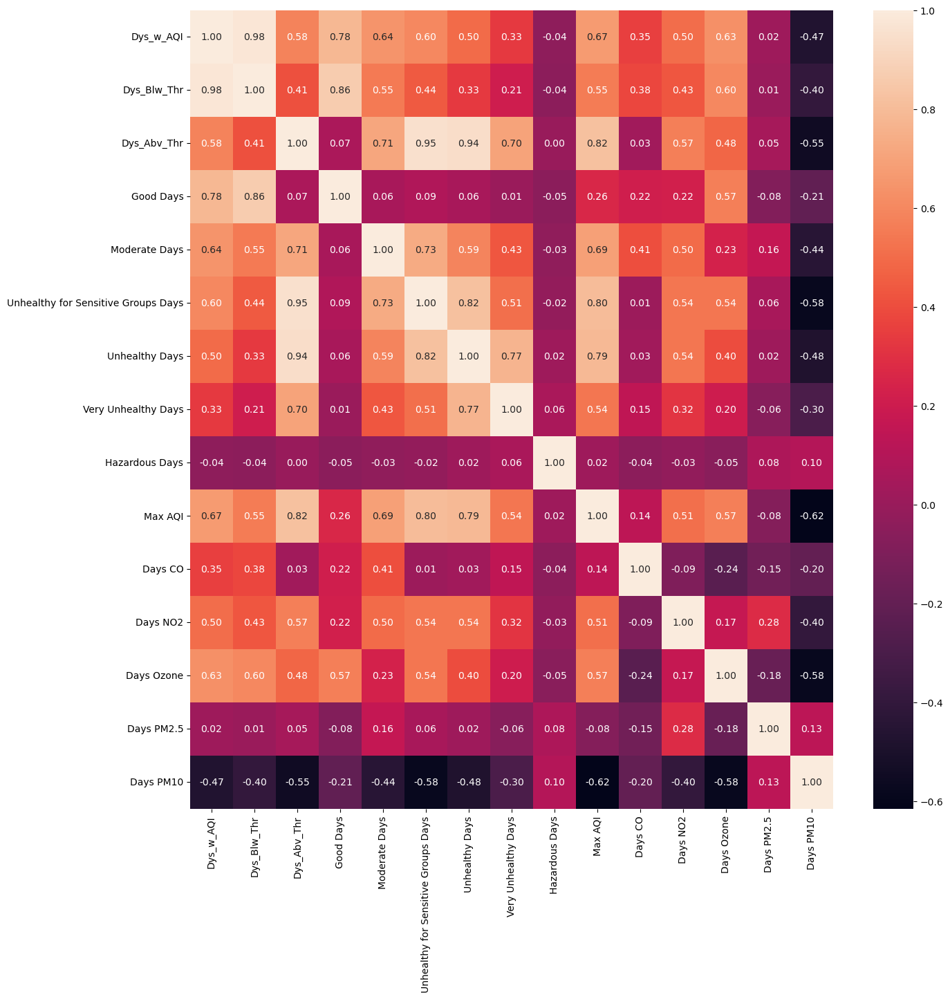

In [14]:
## Before 2000 Correlation Matrix
matrix1 = dfnum1.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(matrix1, annot=True, fmt=".2f")
plt.show()

In [15]:
## Before 2000 CATEGORICAL
dfcat1 = df1.iloc[:,0:2]
dfcat1['Year'] = dfcat1['Year'].astype('object')
print(dfcat1.describe())

categorical = dfcat1.columns

for i in categorical:
    print(i)
    print(dfcat1[i].value_counts())
    print('--------')


            Pop_Est
count  2.030000e+02
mean   4.938503e+06
std    5.393281e+06
min    4.534555e+05
25%    1.233514e+06
50%    3.349348e+06
75%    5.722984e+06
max    3.248601e+07
Year
1997.0    51
1992.0    50
1987.0    49
1982.0    44
1982.5     3
1987.5     2
1983.0     2
1993.0     1
1984.0     1
Name: Year, dtype: int64
--------
Pop_Est
3925263.0     1
647832.0      1
17868844.0    1
18246653.0    1
18656546.0    1
             ..
3765469.0     1
3952747.0     1
4352609.0     1
4344151.0     1
489451.0      1
Name: Pop_Est, Length: 203, dtype: int64
--------


/var/folders/43/gyxj_66s47g_6d21fj128ynm0000gn/T/ipykernel_22697/1697090887.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfcat1['Year'] = dfcat1['Year'].astype('object')


In [16]:
## After 2000
dfnum2.describe()


,Dys_w_AQI,Dys_Blw_Thr,Dys_Abv_Thr,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10
count,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000
mean,297.339261,289.918342,6.466282,226.159018,60.621905,5.370372,0.931179,0.108243,0.022018,124.825681,2.190973,8.850520,161.575991,103.876031,17.419439
std,46.224583,46.261775,7.615560,50.525780,29.118180,5.881853,1.668256,0.448101,0.099638,38.957817,6.343599,12.697960,61.744222,57.916513,26.263346
min,157.750000,157.083333,0.000000,104.857143,2.250000,0.000000,0.000000,0.000000,0.000000,58.750000,0.000000,0.000000,10.882353,12.692308,0.000000
25%,271.133333,259.371224,1.157895,190.025641,40.825000,1.037500,0.052632,0.000000,0.000000,100.127990,0.000000,1.083333,124.314655,66.658442,0.514706
50%,297.666667,292.300000,3.833333,232.230769,56.939394,3.290323,0.266667,0.000000,0.000000,116.357143,0.102564,3.822222,174.000000,94.259259,6.142857
75%,338.072134,329.090909,8.634615,263.283626,79.188492,7.774453,1.091071,0.028595,0.000000,140.349415,0.755000,9.970588,203.682143,124.500000,21.455128
max,365.000000,362.750000,50.567610,358.500000,213.000000,34.246506,13.601153,5.615385,0.839623,367.547170,47.666667,68.000000,292.777778,309.000000,139.000000


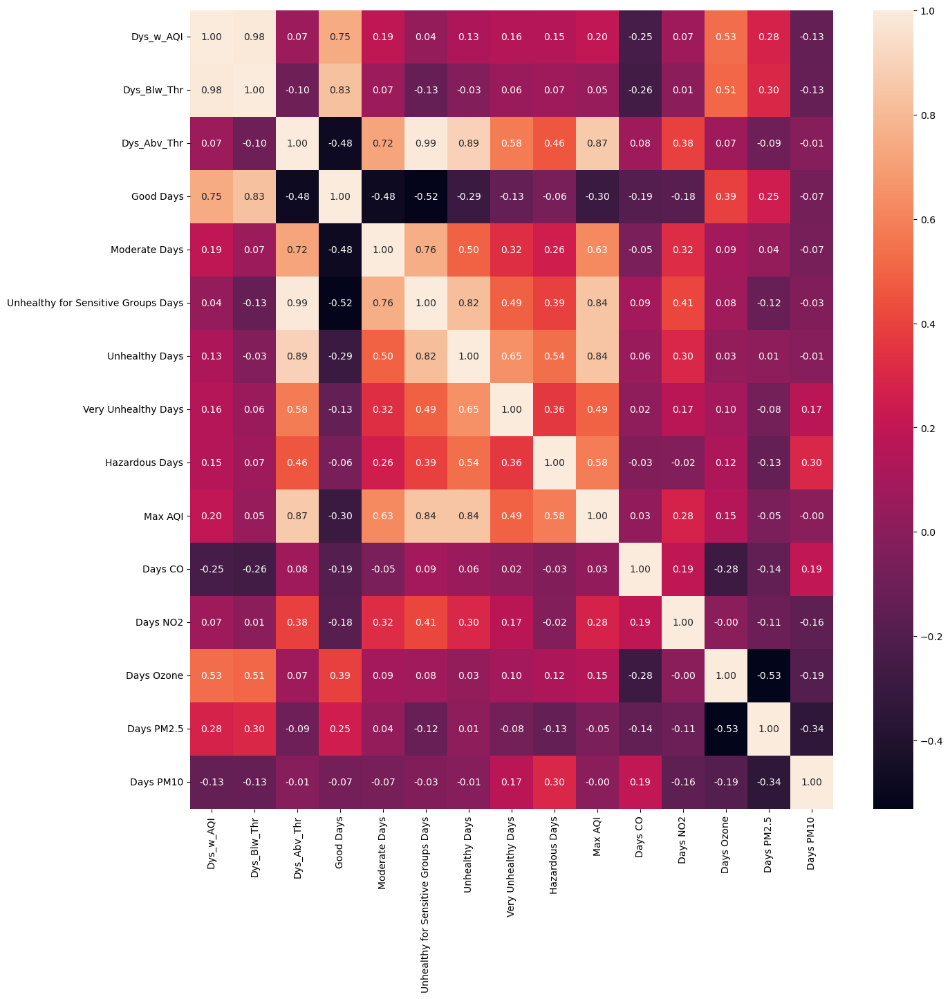

In [17]:
matrix2 = dfnum2.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(matrix2, annot=True, fmt=".2f")
plt.show()

In [18]:
## After 2000 CATEGORICAL
dfcat2 = df2.iloc[:,0:2]
dfcat2['Year'] = dfcat2['Year'].astype('object')
print(dfcat2.describe())

categorical = dfcat2.columns

for i in categorical:
    print(i)
    print(dfcat2[i].value_counts())
    print('--------')

            Pop_Est
count  2.550000e+02
mean   6.118955e+06
std    6.895400e+06
min    5.000170e+05
25%    1.724018e+06
50%    4.256672e+06
75%    7.018889e+06
max    3.933778e+07
Year
2007.0    51
2012.0    51
2017.0    51
2002.0    50
2021.0    48
2021.5     2
2003.0     1
2020.5     1
Name: Year, dtype: int64
--------
Pop_Est
4480089.0     1
11407889.0    1
19574362.0    1
19593849.0    1
19857492.0    1
             ..
4497267.0     1
4435586.0     1
4602067.0     1
4666998.0     1
579483.0      1
Name: Pop_Est, Length: 255, dtype: int64
--------


/var/folders/43/gyxj_66s47g_6d21fj128ynm0000gn/T/ipykernel_22697/3147588764.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfcat2['Year'] = dfcat2['Year'].astype('object')


### Pairwise Analysis

In general most of the variables do not present strong correlations, still some variables are highly correlated one with each other. Some of these correlations are logical. For example, there is a strong correlation between the total number of days that were above the moderate threshold and the total number of days that were considered unhealthy with the Maximum AQI reported.

## 5. Scaling Decisions

Please read the **NOTE** Section at the beginning of the document. Before performing the analysis, there was a normalization in such way that we get the values of days/county accounting for the total number of counties that reported per each state in each year. 

Due to the presence of variables where there are more numbers per year per county, for example, the values per year of number of days where AQI was reported is higher than the values per year of number of days that where hazardous, there should be some further scaling in the dataset

In [19]:
### Before 2000
df1_numerical_scale = dfnum1.copy()

# Scaling
scaler = StandardScaler()
scaled = scaler.fit_transform(df1_numerical_scale)
df1_numerical_scale = pd.DataFrame(scaled, columns = df1_numerical_scale.columns, index = df1_numerical_scale.index)
print(df1_numerical_scale.describe().round(2))

unscale = scaler.inverse_transform(df1_numerical_scale)
unscale1 = pd.DataFrame(unscale, columns = df1_numerical_scale.columns)


       Dys_w_AQI  Dys_Blw_Thr  Dys_Abv_Thr  Good Days  Moderate Days  \
count     203.00       203.00       203.00     203.00         203.00   
mean       -0.00        -0.00        -0.00      -0.00           0.00   
std         1.00         1.00         1.00       1.00           1.00   
min        -3.92        -4.14        -1.22      -3.87          -1.83   
25%        -0.58        -0.57        -0.81      -0.66          -0.69   
50%         0.03         0.03        -0.17      -0.00          -0.05   
75%         0.79         0.74         0.54       0.72           0.50   
max         1.68         2.21         2.96       3.08           4.50   

       Unhealthy for Sensitive Groups Days  Unhealthy Days  \
count                               203.00          203.00   
mean                                  0.00            0.00   
std                                   1.00            1.00   
min                                  -1.41           -0.95   
25%                                  -0.8

In [20]:
final_df1 = pd.concat([dfcat1, df1_numerical_scale], axis = 1)
final_df1 = final_df1.reset_index()
final_df1

,State,Bin,Year,Pop_Est,Dys_w_AQI,Dys_Blw_Thr,Dys_Abv_Thr,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10
0,Alabama,1980-1984,1982.0,3925263.0,-0.049304,-0.150793,0.974466,-0.235730,0.136307,1.278036,0.721637,0.091895,-0.153731,0.907335,-0.335183,-0.880441,1.396393,-0.314025,-0.868276
1,Alabama,1985-1989,1987.0,4015262.0,0.151876,-0.235531,1.172450,-0.728821,0.501863,1.476546,1.019568,0.019479,-0.153731,0.607292,-0.540012,-0.969075,0.763173,-0.314025,0.205611
2,Alabama,1990-1994,1992.0,4154014.0,-1.722576,-1.813872,-0.825282,-1.522404,-0.829763,-0.830555,-0.727797,-0.487433,-0.153731,-1.014907,-0.749037,-0.825602,-0.764846,-0.041910,0.384592
3,Alabama,1995-1999,1997.0,4367935.0,-1.539432,-1.571163,-0.418116,-1.538454,-0.749841,-0.409546,-0.346148,-0.304945,-0.153731,-0.820110,-0.760017,-0.959257,-0.712935,0.013036,0.401801
4,Alaska,1980-1984,1982.0,453455.5,0.791758,0.569850,0.398007,0.237745,1.167459,0.391080,0.679927,1.540215,-0.153731,1.162649,4.179436,-0.556589,-1.500805,-0.314025,-0.868276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,Wisconsin,1995-1999,1997.0,5266213.0,-0.471132,-0.444208,-0.308679,-0.254455,-0.685110,-0.294643,-0.321121,-0.284668,-0.153731,0.441936,-0.402232,-0.769082,0.642725,0.125327,-0.661453
199,Wyoming,1980-1984,1984.0,504895.0,-3.923636,-4.140856,-1.223845,-3.871053,-1.826680,-1.412399,-0.946776,-0.487433,-0.153731,-2.713178,-0.842217,-0.969075,-2.146416,-0.314025,-0.719125
200,Wyoming,1985-1989,1987.0,476966.0,-2.802221,-2.869537,-1.207915,-2.622720,-1.351513,-1.386118,-0.946776,-0.487433,-0.153731,-1.800456,-0.842217,-0.969075,-1.845709,-0.314025,0.825415
201,Wyoming,1990-1994,1992.0,466251.0,-0.839745,-0.655243,-1.202340,-0.333635,-0.719996,-1.400573,-0.946776,-0.487433,-0.153731,-1.443665,-0.842217,-0.969075,-0.678734,-0.044744,2.159487


In [21]:
### After 2000
df2_numerical_scale = dfnum2.copy()

# Scaling
scaler = StandardScaler()
scaled = scaler.fit_transform(df2_numerical_scale)
df2_numerical_scale = pd.DataFrame(scaled, columns = df2_numerical_scale.columns, index = df2_numerical_scale.index)
print(df2_numerical_scale.describe().round(2))

unscale = scaler.inverse_transform(df2_numerical_scale)
unscale2 = pd.DataFrame(unscale, columns = df2_numerical_scale.columns)


       Dys_w_AQI  Dys_Blw_Thr  Dys_Abv_Thr  Good Days  Moderate Days  \
count     255.00       255.00       255.00     255.00         255.00   
mean       -0.00         0.00         0.00      -0.00           0.00   
std         1.00         1.00         1.00       1.00           1.00   
min        -3.03        -2.88        -0.85      -2.41          -2.01   
25%        -0.57        -0.66        -0.70      -0.72          -0.68   
50%         0.01         0.05        -0.35       0.12          -0.13   
75%         0.88         0.85         0.29       0.74           0.64   
max         1.47         1.58         5.80       2.62           5.24   

       Unhealthy for Sensitive Groups Days  Unhealthy Days  \
count                               255.00          255.00   
mean                                  0.00            0.00   
std                                   1.00            1.00   
min                                  -0.91           -0.56   
25%                                  -0.7

In [22]:
final_df2 = pd.concat([dfcat2, df2_numerical_scale], axis = 1)
final_df2 = final_df2.reset_index()
final_df2


,State,Bin,Year,Pop_Est,Dys_w_AQI,Dys_Blw_Thr,Dys_Abv_Thr,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10
0,Alabama,2000-2004,2002.0,4480089.0,-1.372945,-1.433608,0.947343,-1.630105,0.652060,1.023895,0.584741,-0.038760,-0.221414,0.314339,-0.044523,-0.647873,-0.305502,-0.447660,-0.286109
1,Alabama,2005-2009,2007.0,4672840.0,-0.656495,-0.677229,0.360767,-1.609448,1.148552,0.547324,-0.183893,-0.242035,-0.221414,-0.052313,-0.171487,-0.698374,-0.290627,-0.005640,-0.381446
2,Alabama,2010-2014,2012.0,4816632.0,-0.794917,-0.651812,-0.355442,-0.495424,-0.067955,-0.313605,-0.417953,-0.242035,-0.221414,-0.375254,-0.346063,-0.698374,0.187188,-0.325648,-0.527671
3,Alabama,2015-2019,2017.0,4877989.0,-0.218093,-0.083663,-0.719190,0.045322,-0.080100,-0.744488,-0.488613,-0.242035,-0.221414,-0.527048,-0.346063,-0.689091,-0.087781,0.405816,-0.541635
4,Alabama,2020-2023,2021.0,5049846.0,-0.174982,-0.021334,-0.806902,0.312817,-0.468734,-0.858054,-0.559273,-0.242035,-0.221414,-0.875483,-0.346063,-0.693113,-0.231126,0.650325,-0.651848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,Wyoming,2000-2004,2002.0,500017.0,-1.849818,-1.730922,-0.550030,-1.241162,-0.523791,-0.574139,-0.399111,-0.242035,-0.221414,-0.521904,-0.325003,-0.692738,-1.272944,-1.205161,3.005538
251,Wyoming,2005-2009,2007.0,534876.0,-1.298627,-1.184815,-0.587621,-0.673901,-0.070558,-0.610642,-0.387671,-0.242035,-0.221414,-0.614387,-0.233242,-0.303836,-0.510377,-1.248557,2.409296
252,Wyoming,2010-2014,2012.0,576656.0,-0.051910,0.067948,-0.741118,0.078373,-0.046252,-0.782343,-0.496051,-0.242035,-0.221414,-0.677077,-0.337749,-0.334522,0.426998,-1.305385,2.031422
253,Wyoming,2015-2019,2017.0,580116.0,0.694709,0.830813,-0.698416,0.726411,-0.523067,-0.753453,-0.459172,-0.242035,-0.221414,-0.471323,-0.346063,-0.558094,1.711691,-1.519311,0.939775


## 6. Clusterability and Clustering Structure

Let's analyze the clustering structure for each dataset

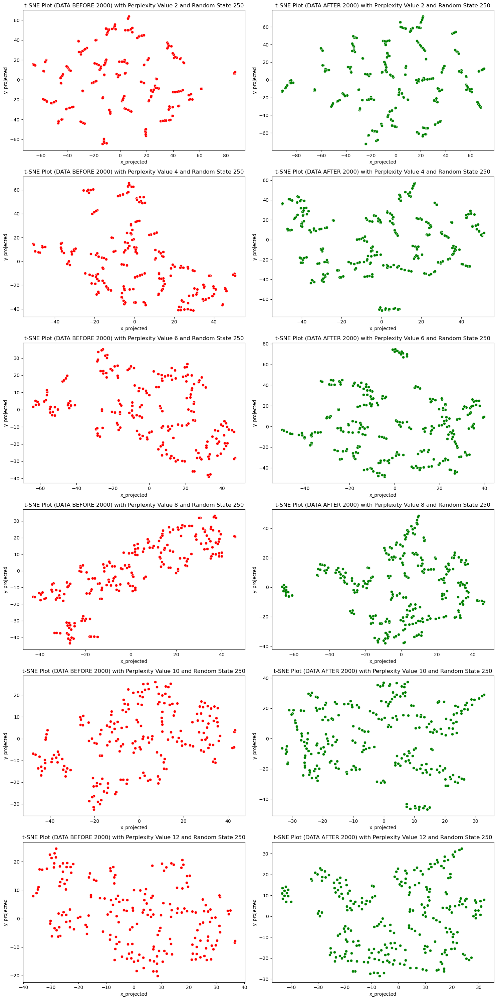

In [23]:
## Before 2000

fig, axes = plt.subplots(6, 2, figsize=(15, 30))  
axes = axes.ravel() 

plot_number = 0
for perp in [2, 4, 6, 8, 10, 12]:
    for rs in [250]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df1_numerical_scale)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo1 = pd.concat([final_df1, df_tsne], axis=1) 

        # Plot in the next subplot
        ax = axes[plot_number]
        sns.scatterplot(x='x_projected', y='y_projected', data=df_combo1, color='red', ax=ax)
        ax.set_title(f't-SNE Plot (DATA BEFORE 2000) with Perplexity Value {perp} and Random State {rs}')

        plot_number += 2
        
plot_number = 1
for perp in [2, 4, 6, 8, 10, 12]:
    for rs in [250]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df2_numerical_scale)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_tsne.index = final_df2.index
        df_combo2 = pd.concat([final_df2, df_tsne], axis=1) 

        # Plot in the next subplot
        ax = axes[plot_number]
        sns.scatterplot(x='x_projected', y='y_projected', data=df_combo2, color='green', ax=ax)
        ax.set_title(f't-SNE Plot (DATA AFTER 2000) with Perplexity Value {perp} and Random State {rs}')

        plot_number += 2    

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 't-SNE Plot (DATA AFTER 2000) with Perplexity Value 8 and Random State 250')

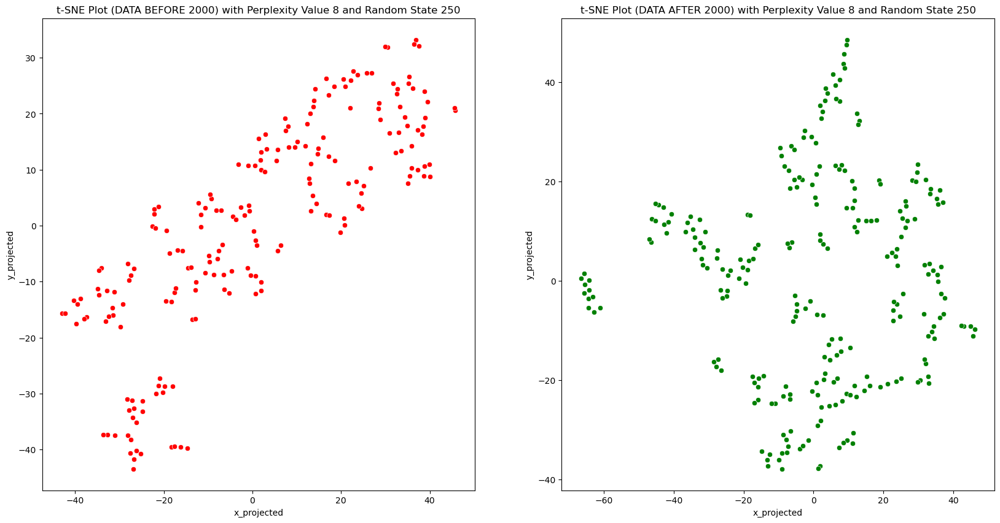

In [24]:

fig, axes = plt.subplots(1, 2, figsize=(20, 10))  
axes = axes.ravel() 

plot_number = 0
tsne = TSNE(n_components=2, perplexity=8, random_state=250)
data_tsne = tsne.fit_transform(df1_numerical_scale)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_tsne.index = final_df1.index
df_combo1 = pd.concat([final_df1, df_tsne], axis=1) 

ax = axes[plot_number]
sns.scatterplot(x='x_projected', y='y_projected', data=df_combo1, color='red', ax=ax)
ax.set_title(f't-SNE Plot (DATA BEFORE 2000) with Perplexity Value 8 and Random State 250')

plot_number = 1
tsne = TSNE(n_components=2, perplexity=8, random_state=250)
data_tsne = tsne.fit_transform(df2_numerical_scale)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_tsne.index = final_df2.index
df_combo2 = pd.concat([final_df2, df_tsne], axis=1) 

ax = axes[plot_number]
sns.scatterplot(x='x_projected', y='y_projected', data=df_combo2, color='green', ax=ax)
ax.set_title(f't-SNE Plot (DATA AFTER 2000) with Perplexity Value 8 and Random State 250')


#### Underlying Cluster Structure

| Question | Dataset 1 (Before 2000) | Dataset 2 (After 2000)|
|:----------|-------------------------|----------------------|
|Number of clusters| 2-4 | 2-4|
|Balanced in Size | No | No| 
|Separation|Somehow Separated | Somehow Separated |
|Nested Clusters | Yes | Yes |
|Shape| Between Spherical and Convex | Between Spherical and Convex |


#### Association between variables and clustering structure

There is association between the variables and the clustering structure, also it is possible to observe that there are still outliers in the dataset which impact significantly the election of clustering algorithms

In [26]:
df_combo1.shape

(203, 21)

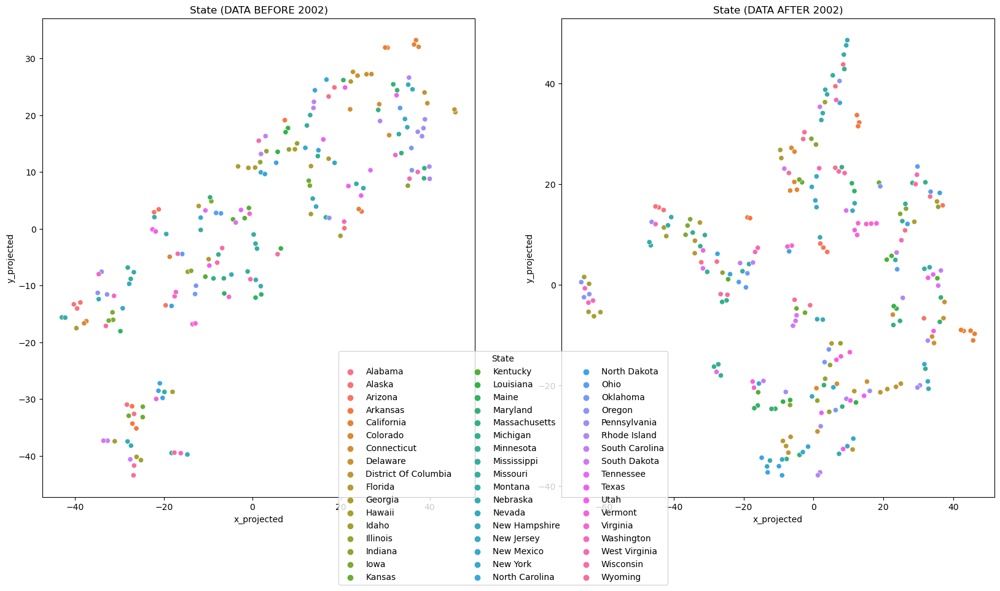

______________________


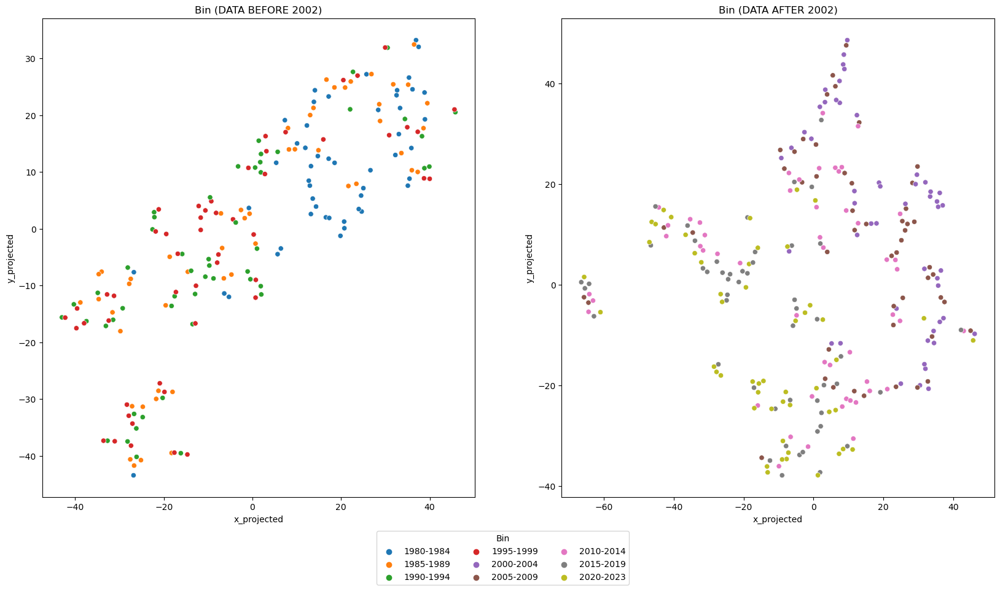

______________________


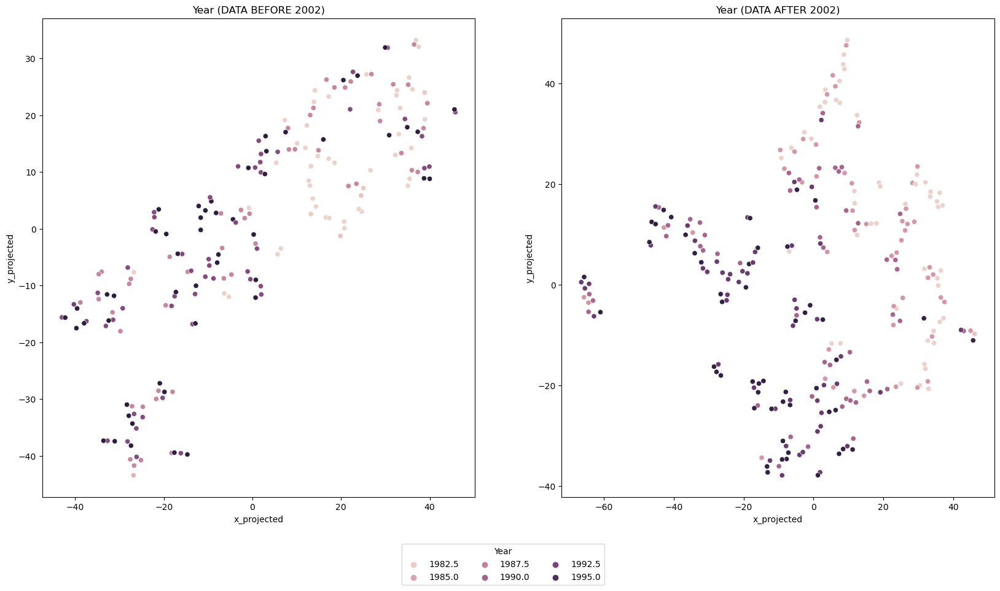

______________________


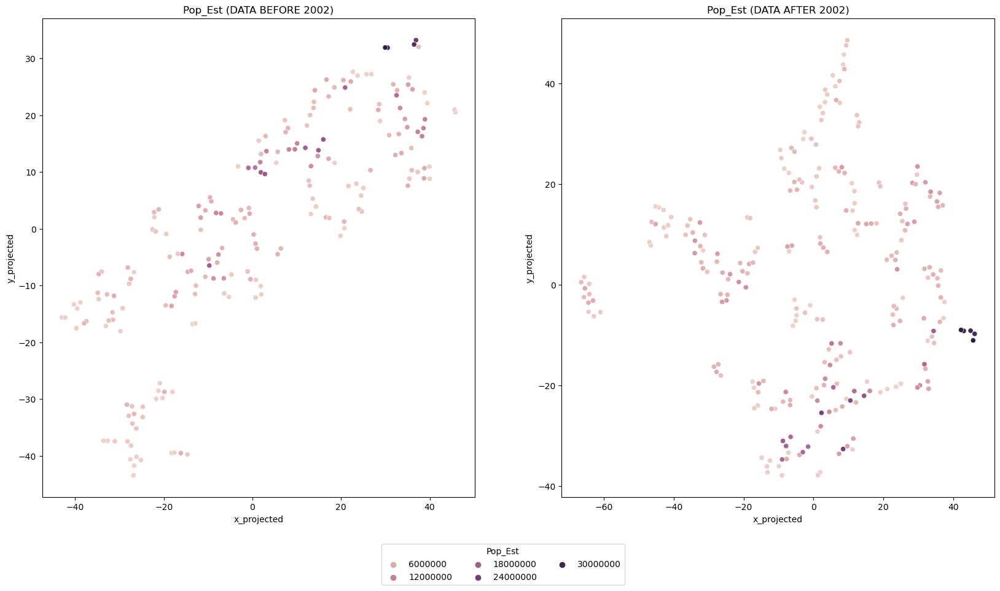

______________________


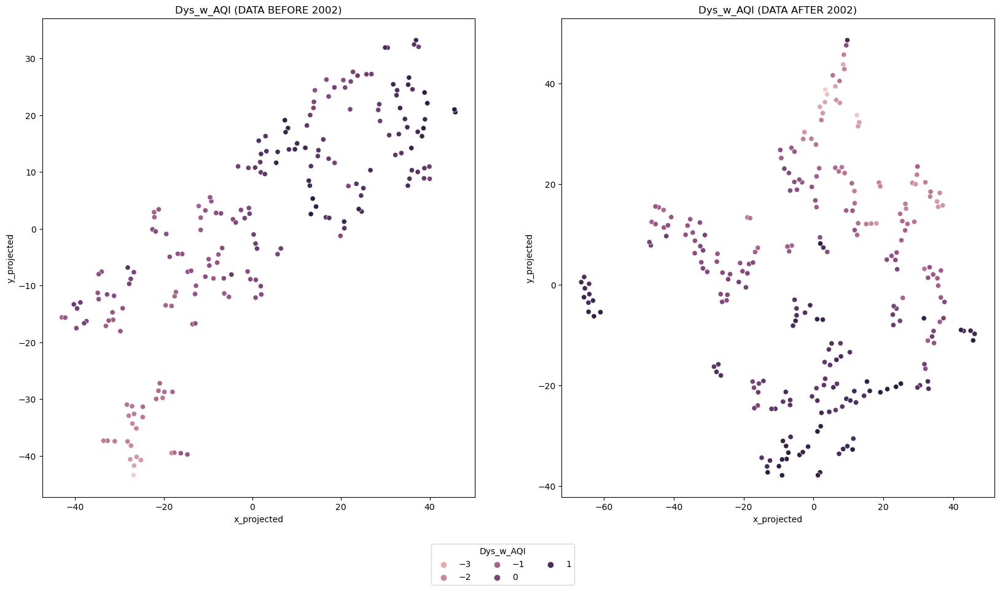

______________________


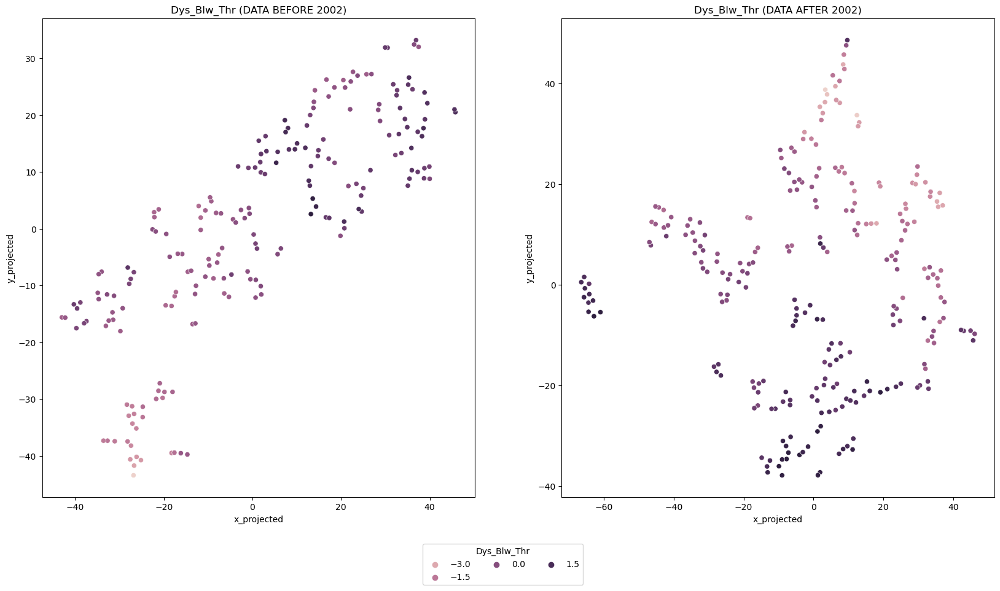

______________________


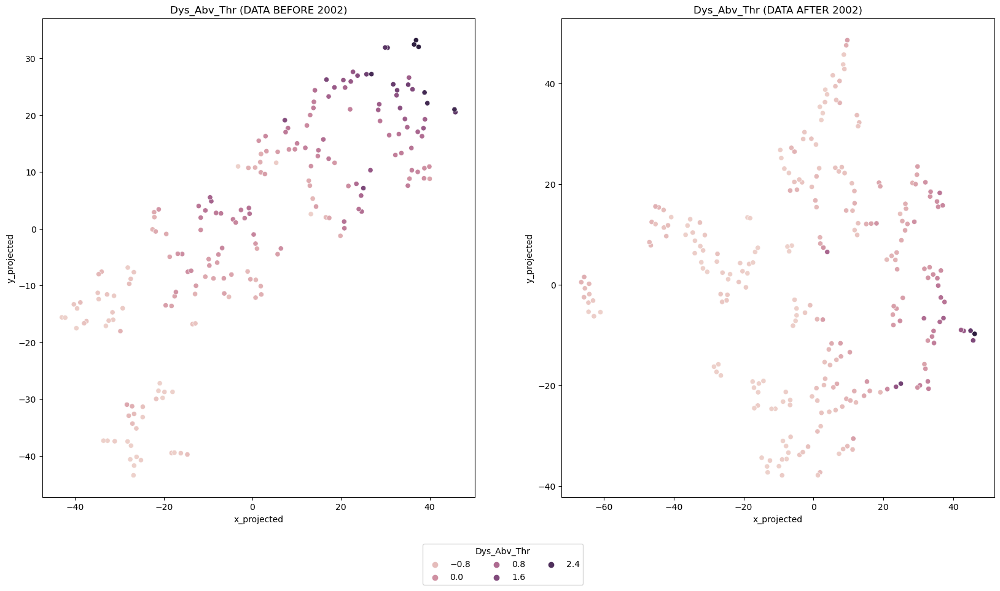

______________________


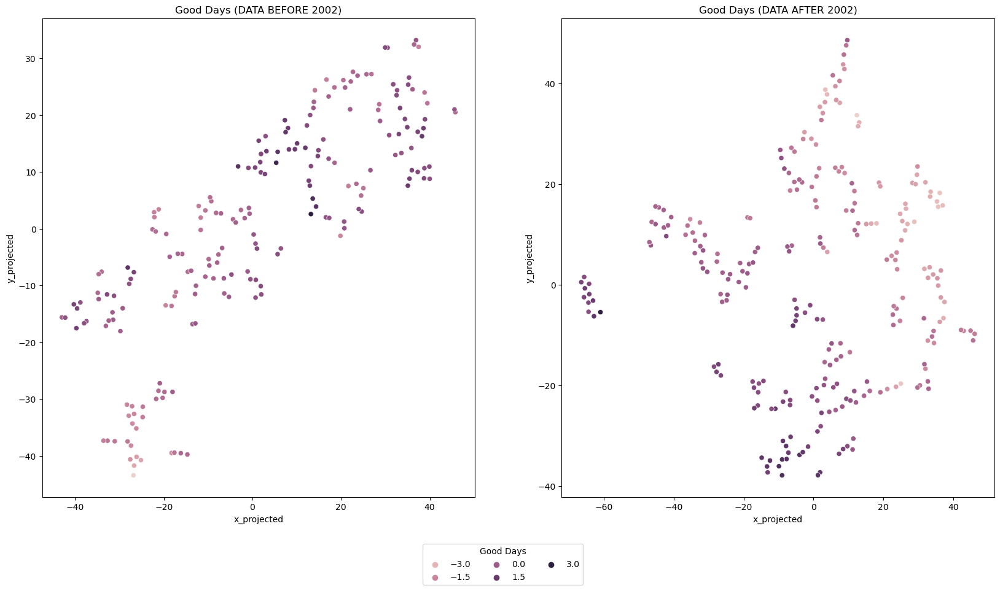

______________________


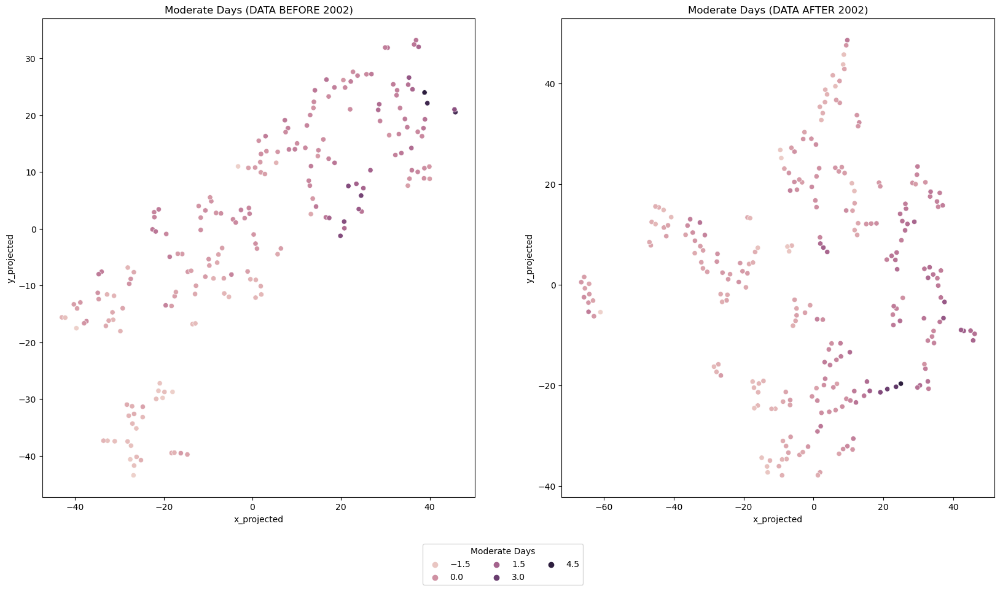

______________________


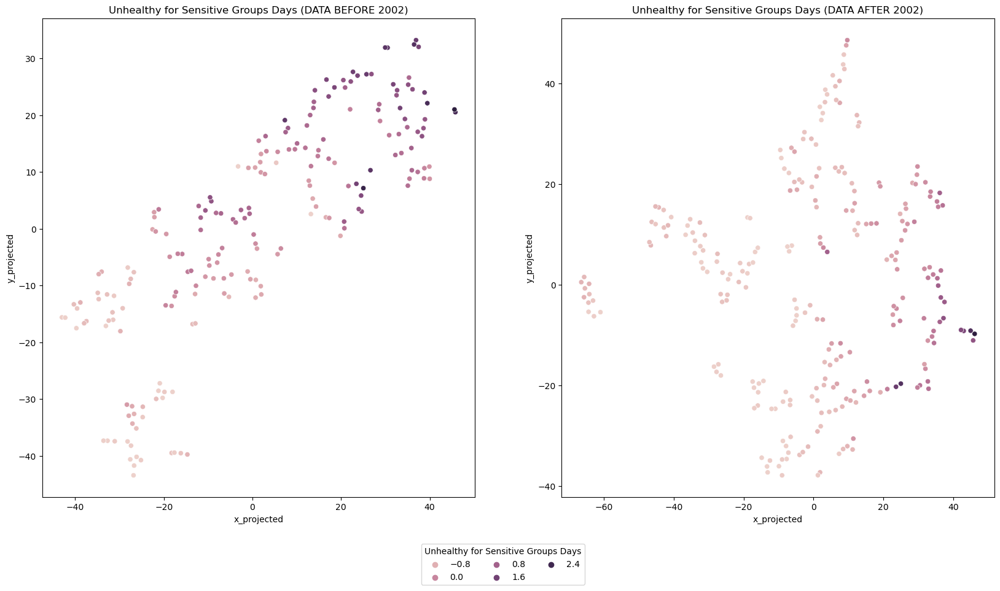

______________________


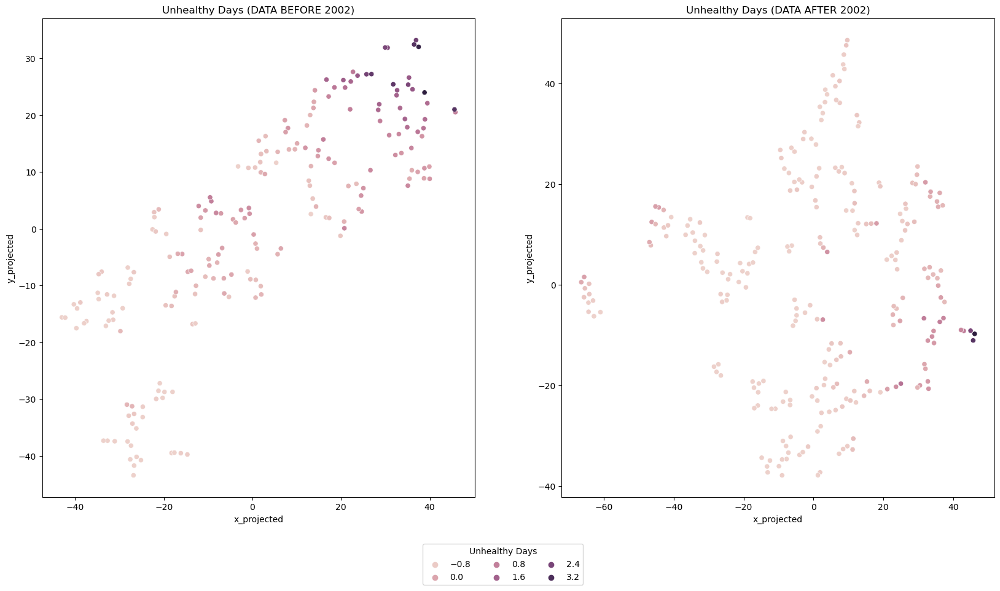

______________________


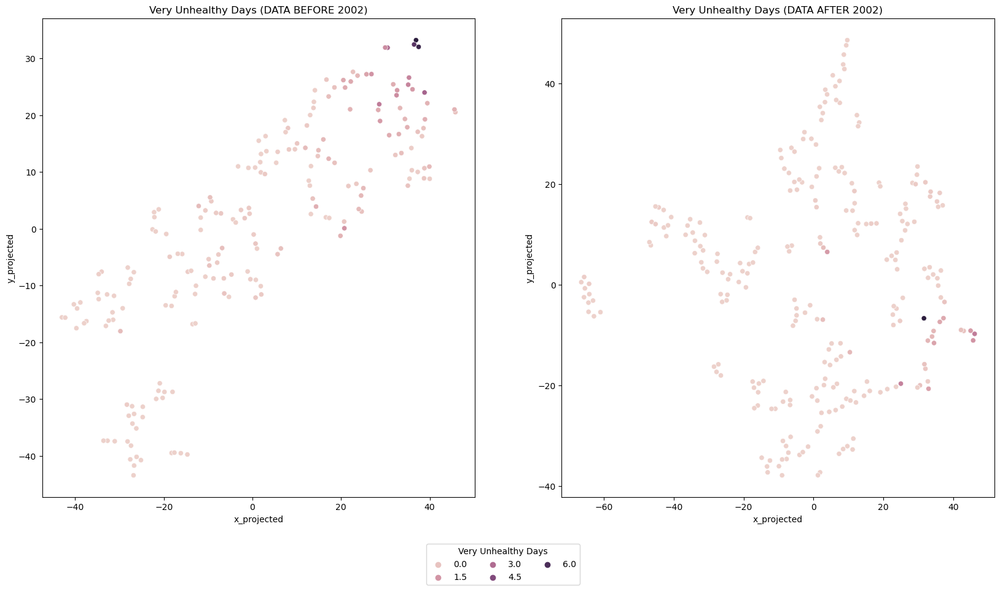

______________________


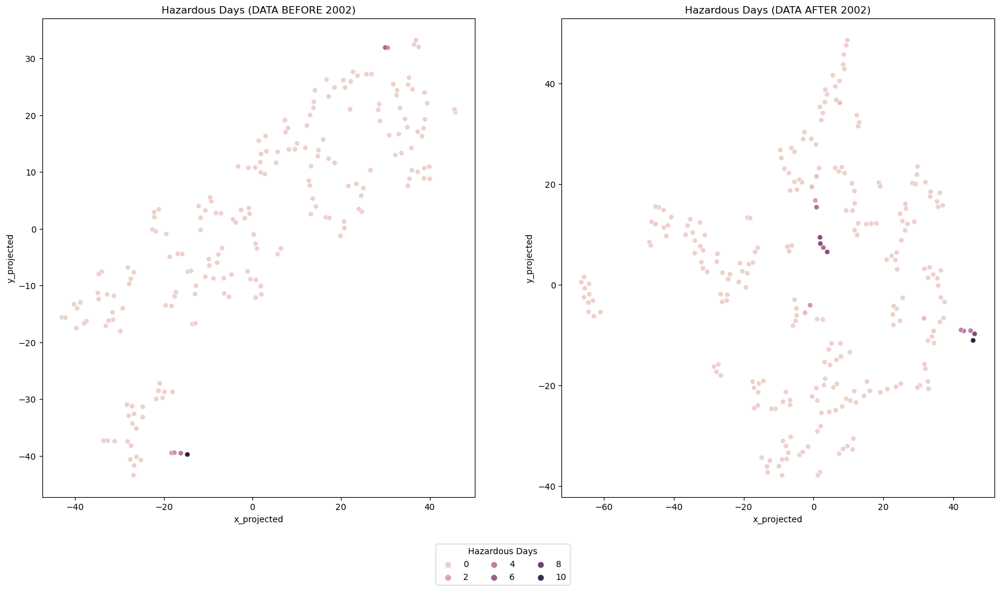

______________________


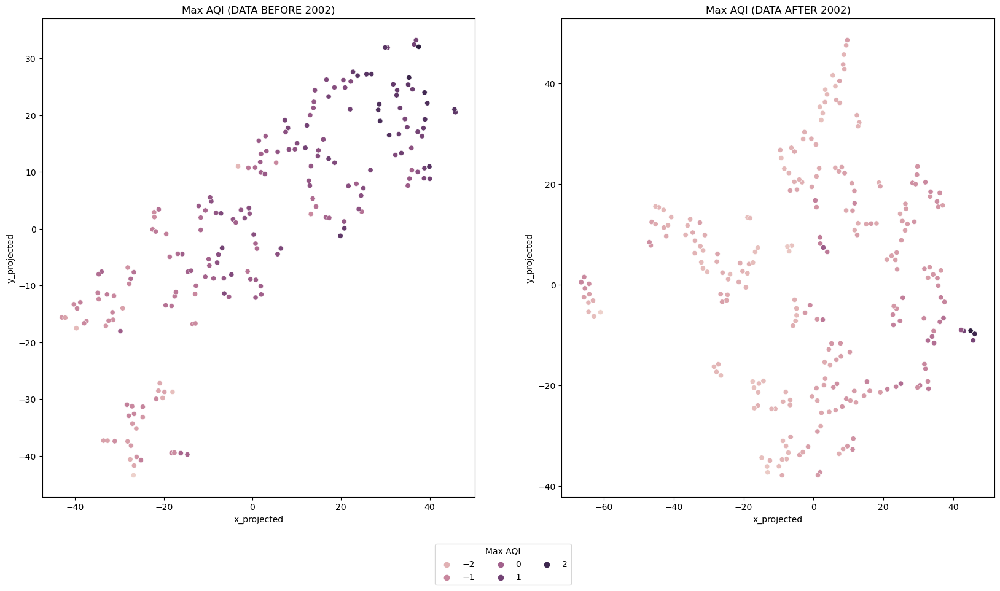

______________________


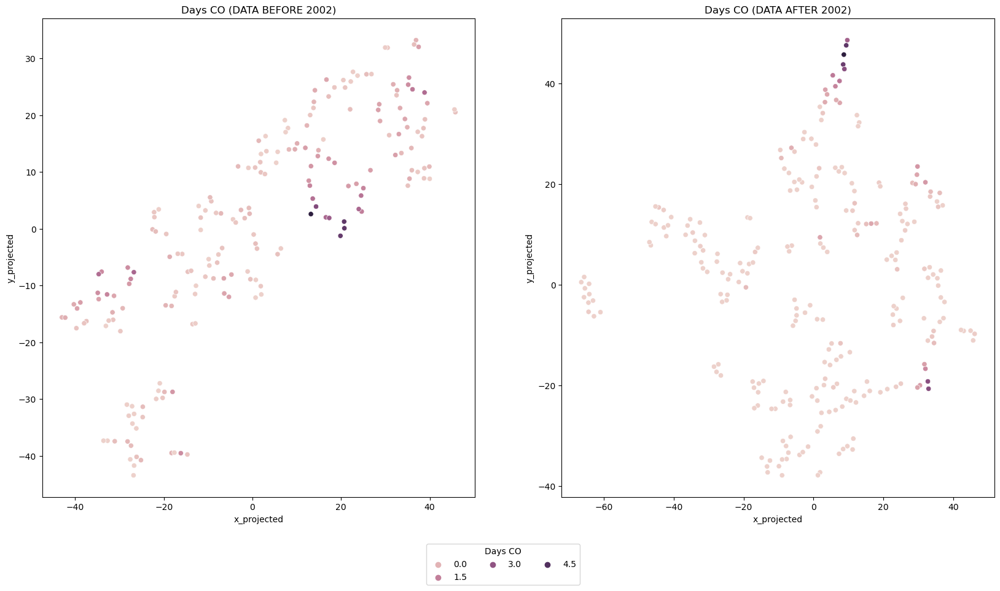

______________________


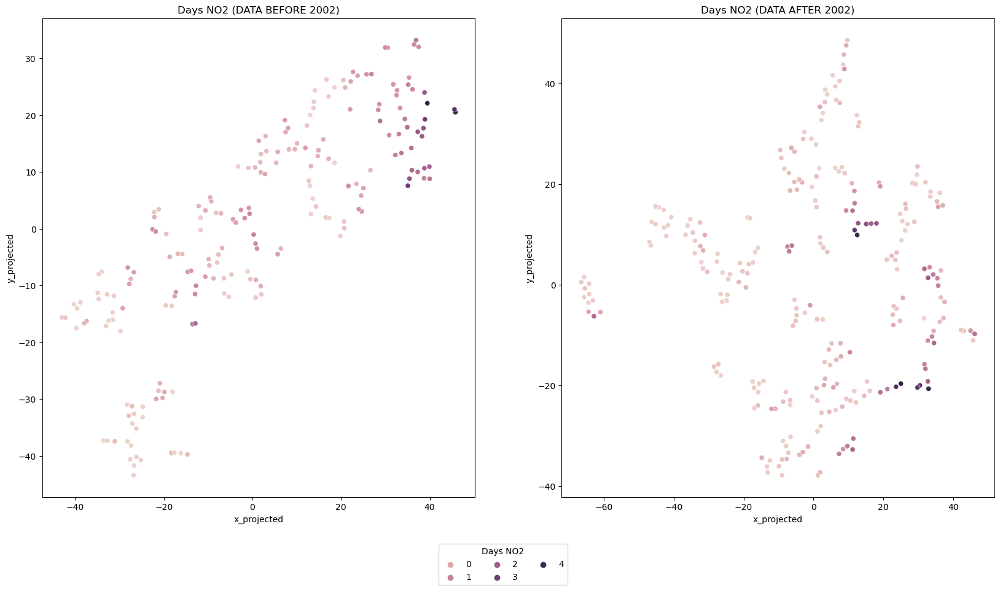

______________________


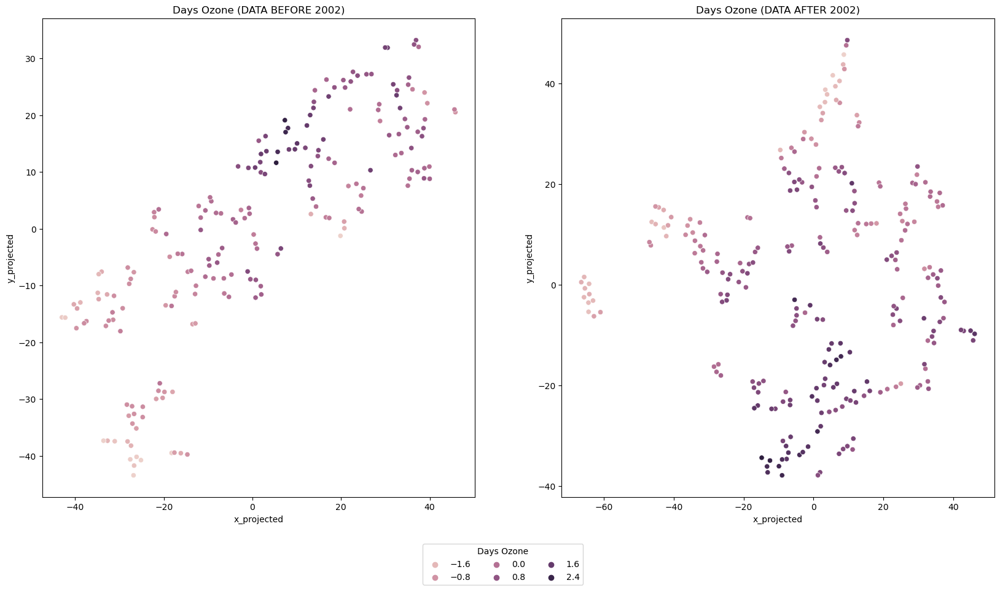

______________________


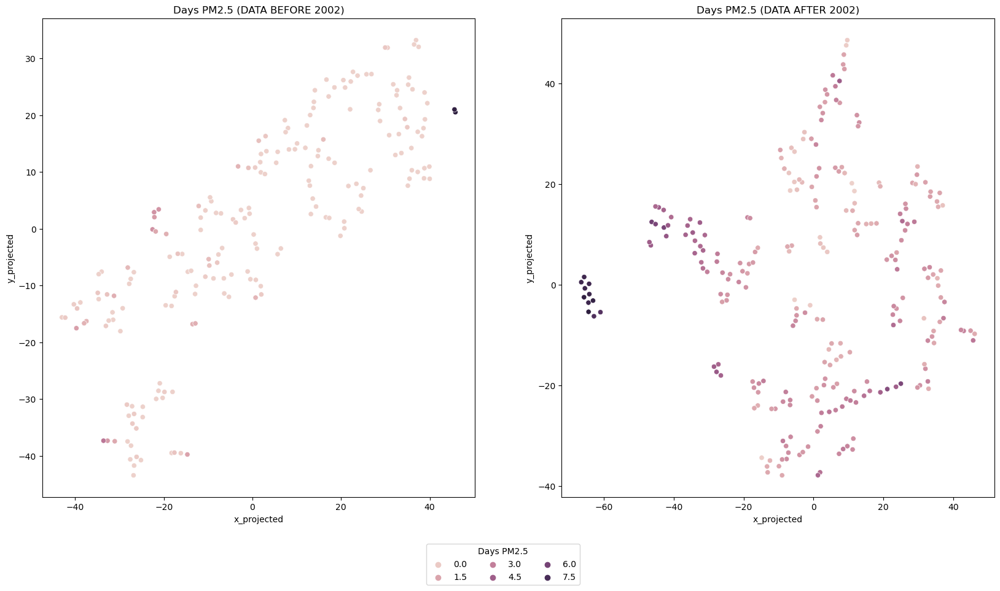

______________________


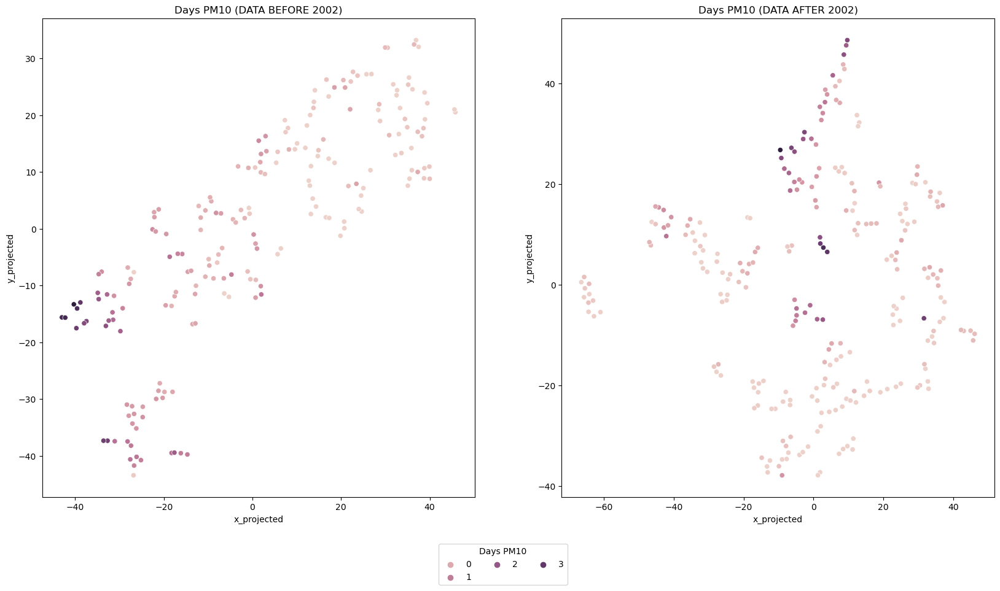

______________________


In [25]:
for i in range(0,19):
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))  
    axes = axes.ravel() 
    
    col = df_combo1.columns[i]
    plot_number = 0
    ax1 = axes[plot_number]
    sns.scatterplot(x='x_projected', y='y_projected', data=df_combo1, hue = col, ax=ax1)
    ax1.set_title(f'{col} (DATA BEFORE 2002)')
    
    col = df_combo2.columns[i]
    plot_number = 1
    ax2 = axes[plot_number]
    sns.scatterplot(x='x_projected', y='y_projected', data=df_combo2, hue = col, ax=ax2)
    ax2.set_title(f'{col} (DATA AFTER 2002)')
    
    
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', title = col, ncol=3, bbox_to_anchor=(0.5, -0.05))

    # Remove individual legends from subplots
    ax1.get_legend().remove()
    ax2.get_legend().remove()
    
    plt.subplots_adjust(bottom=0.1)
    plt.show()
    print('______________________')






#### tSNE - Considerations

**NOTE : It is important to highlight, that the t-SNE plot previously displayed does not provide information related to the original dataset properties when it comes to displaying the distance between objects, the distance between clusters, the sparsity of the cluster, and the location of clusters in the dataset, the previous due to the deterministic nature of the algorithm**

## 7. Clustering Algorithm Selection Motivation

The presence of outliers in our dataset, restricted the posibilities of algorithms that could be used. These algorithms are the most suitable for these dataset

### Clustering Algorithm #1
### - K-Medoids
K-Medoids is an algorithm that partitions data into k distinct clusters. It finds the medoids that attempt to minimize the sum of distances between points and the nearest medoid. An advantage of K-medoids over other similar algorithm as K-means is the capacity to handle outliers by using an observation as a part of the medoid. This is one of the reasons why it is an optimal algorithm for these dataset. Even after the removal of outliers, the data itself kept displaying observations that could be outliers. The point of the analysis is to include observations and analysis of all the states, and even when any of these states could be an outlier, it is of interest to identify what type of observations could be the closest to these outliers, this will convey information about AQI index report habits and probably AQI in a group of states.

K-Medoids is suitable for datasets with outliers, with a medium number of observations and with clusters that are not necessarily spherical (but it is suitable if they are still spherical). 



### Clustering Algorithm #2
### - BIRCH
BIRCH is a very good clustering algorithm for large data-sets. This is an advantage useful for these dataset in the sense that the clustering structure can be continued to be explored with new observations that can come in future years or that can be recollected from previous years. An advantage it offers is the capacity to handle noise and outliers making it suitable for this dataset. One limitation is the fact that it requires merely numerical data, but this is not a limitation for this dataset. Similarly, due to the interest in finding a change in the clustering structure over the years, the fact that new information can be added in the future makes this algorithm very advatangeous for the type of research question proposed in this document.

BIRCH is suitable for spherical clusters, it requires numerical data, it can handle noise and outliers, it is an online clustering algorithm, these properties are met by these dataset



#### Fuzzy Algorithm
Follow Up Question:

Given that the research question aims to understand specifically changes in the clustering structure in two periods of times, hard assignment is required. The project aims to underestand for each period evaluated the intrinsic nature of an observation within a cluster. For example, assume that in the period between 1995-1999 Idaho places itself in the clustering structure in the interface between two clusters, this could indicate that this observation in specific presents characteristics similar to both clusters, but the aim is not to understand this, the aim is to see in general the global structure for each cluster without accounting for observations that can be ambigious.

#### Hierarchical Clustering
Follow Up Question:

One of the proposed algorithms is a clustering algorithm that uses hierarchies. This is useful in the sense of the research question because  it finds nesting structures in the main clusters. For example, assume two clusters were identified, one cluster with high report values and another one with low reports, within each cluster it could be possible to identify observations where the main polutant was CO2, NO2 and so on. This nested structure can be observed by using a hierarchical clustering algorithm.

## 8. Clustering Algorithm Practical Considerations


1. K Medoids
    
    Non deterministic
    
    To handle the non deterministic nature it is possible to use multiple runs with different seeds and reach a consensus approach to identify the best clustering structure. On top of that, the use of metrics like the silhouette score to choose the best run.
    
    In the case that a new observation is included, the new observation can be added to the closest existing medoid. But if there are several new observations, it would be convenient to re run the algorithm.
    
    
 ________
 
    
2. Birch

    Deterministic
    
    For new observations, BIRCH has the capacity to handle this data. This observations can be added to existing CF trees, and the trees structure can change and be rebuilt based on the parameters chosen

## 9. Clustering Algorithm #1 - K Medoid

#### Parameter Selection

1. Number of clusters - 
  We chose to use the number of 2 clusters due to our prior analysis of our dataset using t-SNE plots as well as the average silhouette score plot. When plotting the TSNE plot, using a perplexity value of 8 and a random state of 250, we were able to visually see 2 relatively well separated clusters in both our datasets (before 2002 and after 2002). Due to this, we were able to have evidence of there being 2 clustering structures within the data set. Furthermore, upon graphing the average silhouette score plot, we were able to see that the highest peak in the graph was present around 2 clusters. This was further evidence that there exists 2 clusters.



In [27]:
from sklearn_extra.cluster import KMedoids

Calculating Avg Silhouette for K =  2
Calculating Avg Silhouette for K =  3
Calculating Avg Silhouette for K =  4
Calculating Avg Silhouette for K =  5
Calculating Avg Silhouette for K =  6
Calculating Avg Silhouette for K =  7
Calculating Avg Silhouette for K =  8
Calculating Avg Silhouette for K =  9
Calculating Avg Silhouette for K =  10
Calculating Avg Silhouette for K =  11
Calculating Avg Silhouette for K =  12
Calculating Avg Silhouette for K =  13
Calculating Avg Silhouette for K =  14
Calculating Avg Silhouette for K =  15
Calculating Avg Silhouette for K =  16
Calculating Avg Silhouette for K =  17
Calculating Avg Silhouette for K =  18
Calculating Avg Silhouette for K =  19
Calculating Avg Silhouette for K =  20
Calculating Avg Silhouette for K =  21
Calculating Avg Silhouette for K =  22
Calculating Avg Silhouette for K =  23
Calculating Avg Silhouette for K =  24
Calculating Avg Silhouette for K =  25
Calculating Avg Silhouette for K =  26
Calculating Avg Silhouette for K 

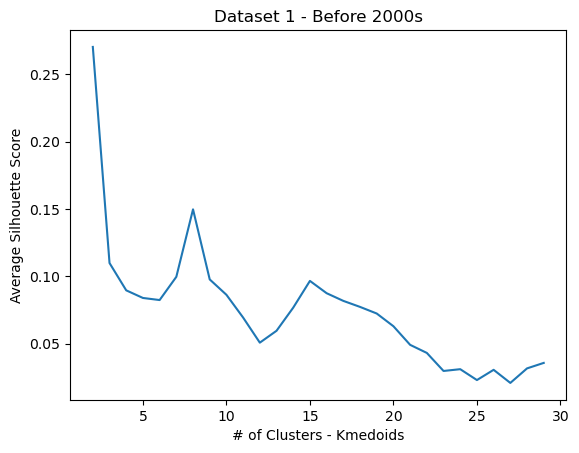

Calculating Avg Silhouette for K =  2
Calculating Avg Silhouette for K =  3
Calculating Avg Silhouette for K =  4
Calculating Avg Silhouette for K =  5
Calculating Avg Silhouette for K =  6
Calculating Avg Silhouette for K =  7
Calculating Avg Silhouette for K =  8
Calculating Avg Silhouette for K =  9
Calculating Avg Silhouette for K =  10
Calculating Avg Silhouette for K =  11
Calculating Avg Silhouette for K =  12
Calculating Avg Silhouette for K =  13
Calculating Avg Silhouette for K =  14
Calculating Avg Silhouette for K =  15
Calculating Avg Silhouette for K =  16
Calculating Avg Silhouette for K =  17
Calculating Avg Silhouette for K =  18
Calculating Avg Silhouette for K =  19
Calculating Avg Silhouette for K =  20
Calculating Avg Silhouette for K =  21
Calculating Avg Silhouette for K =  22
Calculating Avg Silhouette for K =  23
Calculating Avg Silhouette for K =  24
Calculating Avg Silhouette for K =  25
Calculating Avg Silhouette for K =  26
Calculating Avg Silhouette for K 

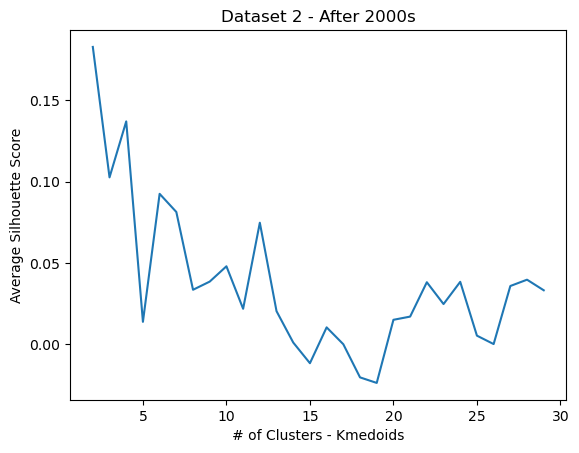

In [28]:
### K medoids
### K medoids

avg_silh1 = []
for i in range(2,30):
    avg_silh_1 = []
    for j in range(0,3):
        kmeans1=KMedoids(n_clusters=i).fit(df1_numerical_scale)
        cluster_labels1=kmeans1.labels_
        sil_score1 = silhouette_score(df1_numerical_scale, cluster_labels1)
        avg_silh_1.append(sil_score1)
    print('Calculating Avg Silhouette for K = ',i)

    avg_silh1.append(np.average(avg_silh_1))

print(avg_silh1)

##Plot
plt.plot(range(2,30),  avg_silh1)
plt.xlabel('# of Clusters - Kmedoids')
plt.ylabel('Average Silhouette Score')
plt.title('Dataset 1 - Before 2000s')
plt.show()


avg_silh2 = []
for i in range(2,30):
    avg_silh_2 = []
    for j in range(0,3):
        kmeans2=KMedoids(n_clusters=i).fit(df2_numerical_scale)
        cluster_labels2=kmeans2.labels_
        sil_score2 = silhouette_score(df2_numerical_scale, cluster_labels2)
        avg_silh_2.append(sil_score2)
    print('Calculating Avg Silhouette for K = ',i)

    avg_silh2.append(np.average(avg_silh_2))

print(avg_silh2)

##Plot
plt.plot(range(2,30),  avg_silh2)
plt.xlabel('# of Clusters - Kmedoids')
plt.ylabel('Average Silhouette Score')
plt.title('Dataset 2 - After 2000s')
plt.show()


### Clustering the data, presenting the data!

Here, we are observing the t-SNE plot to highlight the clusters that the K-Medoids algorithm identified.

Dataset 1 and Dataset 2 The K-Medoids clustering was able to identify two relatively separate clusters. In the light of our research motivation, these clusters are able to show changes in environmental contaminants and the states' reporting patterns regarding the AQI. This clustering approach allowed for the identification of distinct patterns in terms of various temporal characteristics among states, despite possible obstacles such as outliers and noise within our dataset. These clusters may also indicate differing approaches or trends in environmental management strategies and AQI documentation during the examined periods. In light of our research motivation, this contradiction is especially fascinating since it shows the variations between states and offers insightful information about how different areas identify, document, and potentially address environmental challenges. Although the algorithm was able to identify two seperate clusters, we do see that these clusters are not as well seperated and cohesive as we would have liked to see, which can show the limitations of the K-Medoids algorithm with this particular dataset when handling clustering structures that are not similar in size or sparsity.

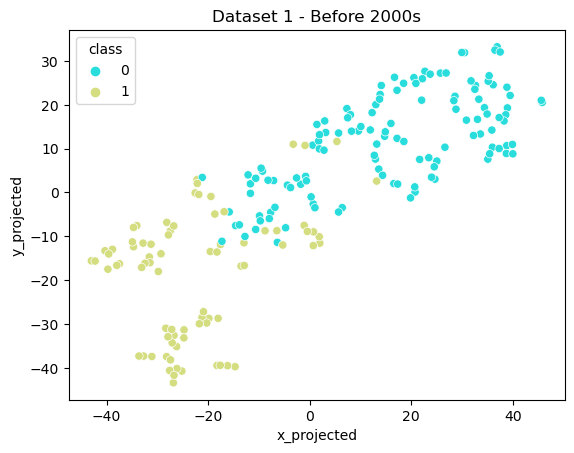

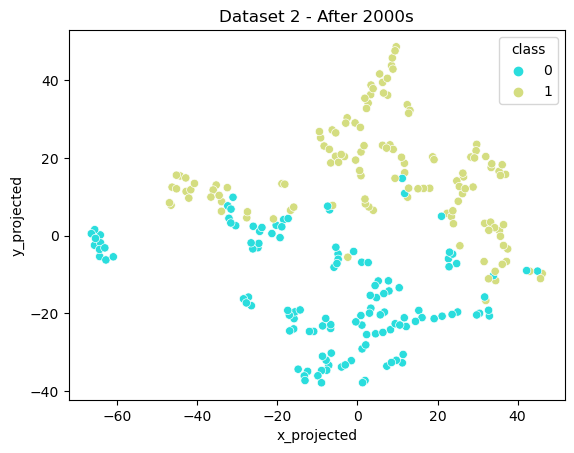

In [29]:
##Before 2000s
kmeans1 = KMedoids(n_clusters = 2, random_state = 100). fit(df1_numerical_scale)
df_combo1['class'] = kmeans1.labels_

sns.scatterplot(x='x_projected', y='y_projected', data=df_combo1, hue = 'class' , palette = 'rainbow')
plt.title('Dataset 1 - Before 2000s')
plt.show()


#After 2000s
kmeans2 = KMedoids(n_clusters = 2, random_state = 100). fit(df2_numerical_scale)
df_combo2['class'] = kmeans2.labels_

sns.scatterplot(x='x_projected', y='y_projected', data=df_combo2, hue = 'class' , palette = 'rainbow')
plt.title('Dataset 2 - After 2000s')
plt.show()

### Additional Cluster Exploration

#### Similarity Matrix

Based on the graphs, we can see that for both Dataset 1 and 2, the clusters are not well seperated and can be seen to be very close to one another. The plot does not show us distinct squares in which the clusters exist. We can also see that in the above t-SNE plot that even though there are two clusters, these are not cohesive in nature.

#### Silhouette plot

As we can see from the plot, both clusters average silhouette score was close to 0. This can show that the points are not defined to any single cluster, and are close to other neighborinig clusters as well. This ambiguity might suggest similarities and/or overlapping characteristics between certain states or time periods in terms of their reporting behaviors or environmental profiles.

#### Shortcommings

Due to the fact that the clusters were not well seperated to begin with, and since there were outliers in our dataset, this could have led to the silhouette plot and the cluster sorted similarity matrix not being the best forms of identifying the cohesiveness of the clusters.

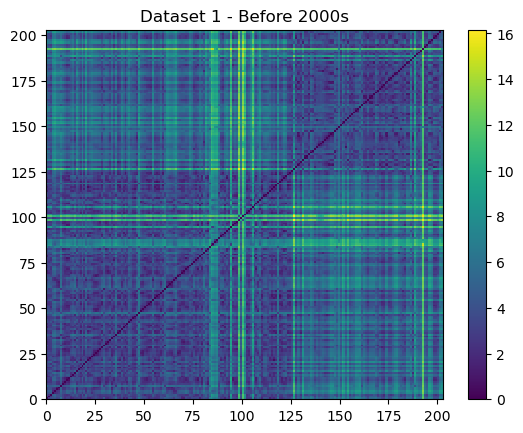

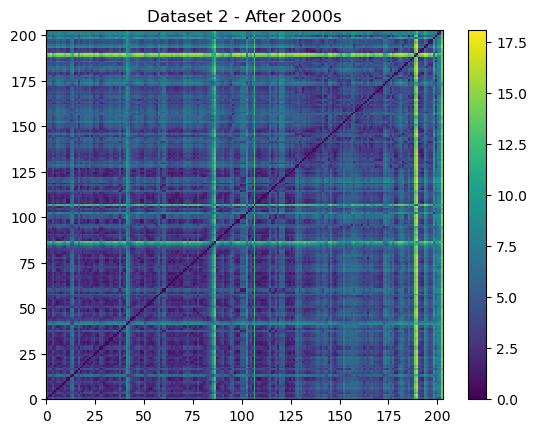

In [30]:
### Before 2000
df_combo1 = df_combo1.sort_values(by = ['class'])
df_sort1 = df_combo1.drop(['State', 'Bin', 'Pop_Est', 'Year', 'x_projected', 'y_projected'], axis = 1)

dist_mat1 = squareform(pdist(df_sort1))

plt.pcolormesh(dist_mat1, cmap = 'viridis')
plt.colorbar()
N = len(df_combo1)
plt.xlim([0,N])
plt.ylim([0,N])
plt.title('Dataset 1 - Before 2000s')
plt.show()



### After 2000

df_combo2 = df_combo2.sort_values(by = ['class'])
df_sort2 = df_combo2.drop(['State', 'Bin', 'Pop_Est', 'Year', 'x_projected', 'y_projected'], axis = 1)

dist_mat2 = squareform(pdist(df_sort2))

plt.pcolormesh(dist_mat2, cmap = 'viridis')
plt.colorbar()
N = len(df_combo1)
plt.xlim([0,N])
plt.ylim([0,N])
plt.title('Dataset 2 - After 2000s')
plt.show()

For n_clusters = 2 The average silhouette_score is : -0.012323280163752165


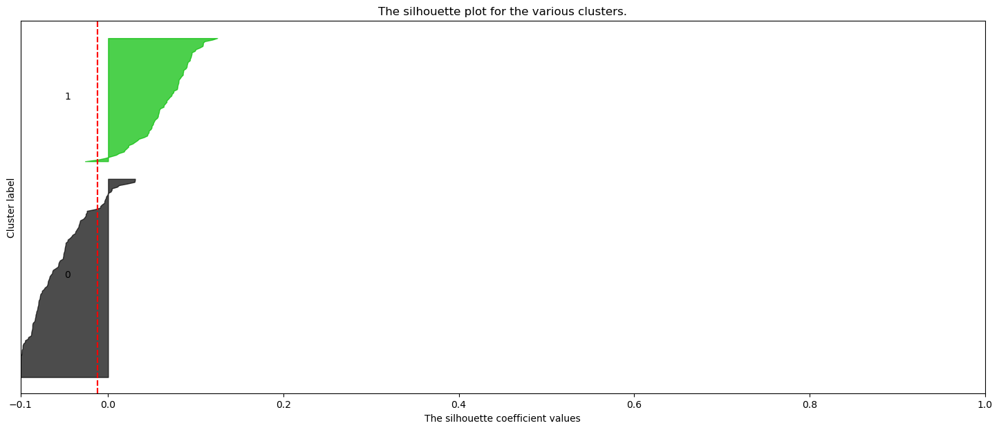

For n_clusters = 2 The average silhouette_score is : 0.004988343595410789


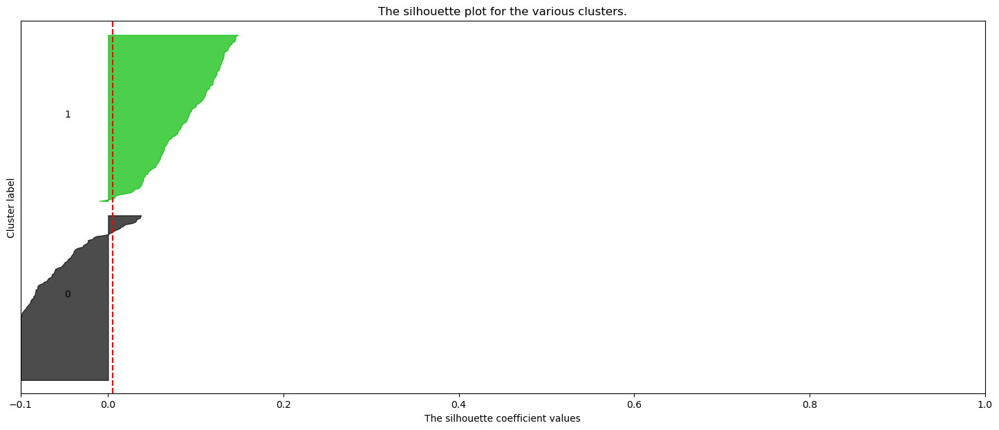

In [32]:
df_labels1 = df_combo1['class']
num1 = df1_numerical_scale
num1 = num1.reset_index()
num1['class'] = df_combo1['class']
num1 = num1.iloc[:,2:18]
show_silhouette_plots(num1, df_labels1)

df_labels2 = df_combo2['class']
num2 = df2_numerical_scale
num2 = num2.reset_index()
num2['class'] = df_combo2['class']
num2 = num2.iloc[:,2:18]
show_silhouette_plots(num2, df_labels2)

#### Cluster Meaningfulness

Although the clusters that we found were not the best in terms of cohesiveness and seperation, we still believe that these clusters are meaningful in terms of our research question. As we are exploring the AQI index over periods of time and different states, these clusters can still show important information that there may be a relationship that exists.



#### Cluster Description

Dataset 1 - Before 2000s

Cluster 0: The Population Estimate is larger in this cluster, as we can see the IQR being larger than it is for cluster 1. Cluster 0 had significiantly more days above the AQI threshold, compared to its cluster counterpart. This cluster also dominated the sum number of days that the ozone was the reason for contamination. Furthermore, since this cluster accounted for more of the data, given the Population Estimate, we can also see that many of the data from all states are dominated in this cluster. We also see that there are more outliers present in this cluster for Population Estimate compared to its cluster counterpart.

Cluster 1: We can see that the Population Estimate is smaller in this cluster, as we can see the IQR being lower than it is for cluster 0. We can also see that due to this, many of the states were not represented in the data, as they were dominated by cluster 0. Furthermore, the days below the AQI threshold was lower than what it was for cluster 0, but given that this cluster accounted for less data points, this number is still significant, and can show that the states this cluster accounted for were healthier in terms of AQI before 2000s.  


Dataset 2 - After 2000s

Cluster 0: The Population Estimate is larger in this cluster, as we can see the IQR being larger than it is for cluster 1. Similar to the dataset before 2000s, this dataset also shows that it accounts for more of the Population Estimate. We can also see that the days below the AQI threshold was significantly higher for this cluster, showing the difference between the AQI levels before and after 2000s for the represented states. We also see that there are more outliers present in this cluster for Population Estimate compared to its cluster counterpart.

Cluster 1: We can see that the Population Estimate is smaller in this cluster, as we can see the IQR being lower than it is for cluster 0. Although this cluster is smaller than cluster 0, we do see that there are more states represented holisiticly in this cluster. Even though this is the case, we do see that in comparison to cluster 0, there are less number of good days overall. This can show that even though there are more states represented holistically, cluster 0 may represent overall healthier states in terms of AQI index compared to this cluster.

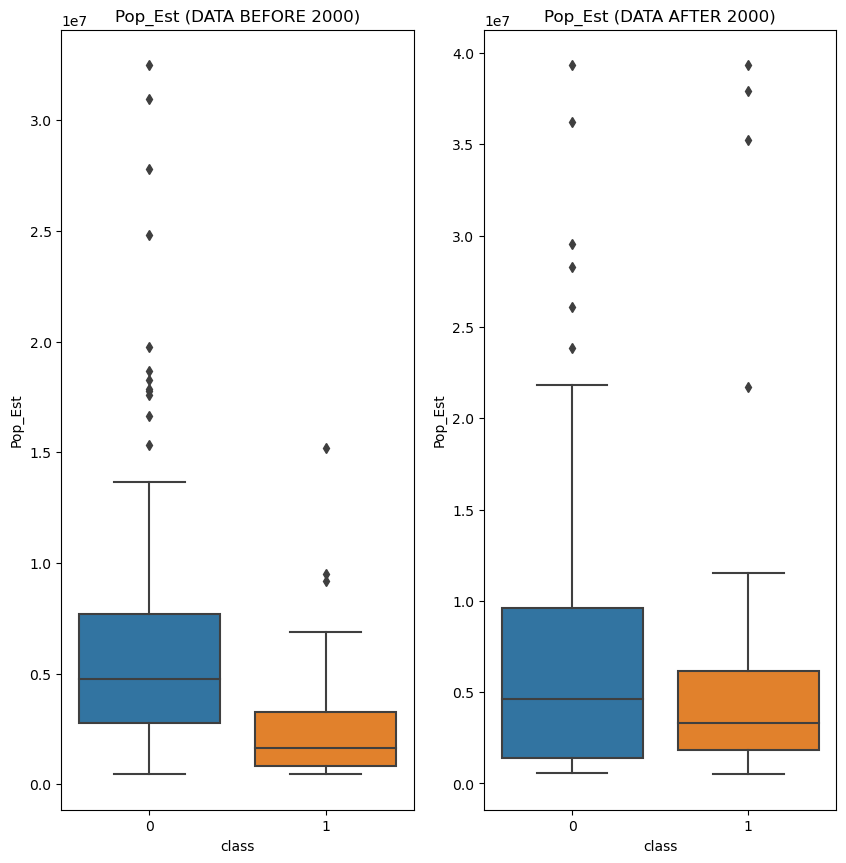

______________________


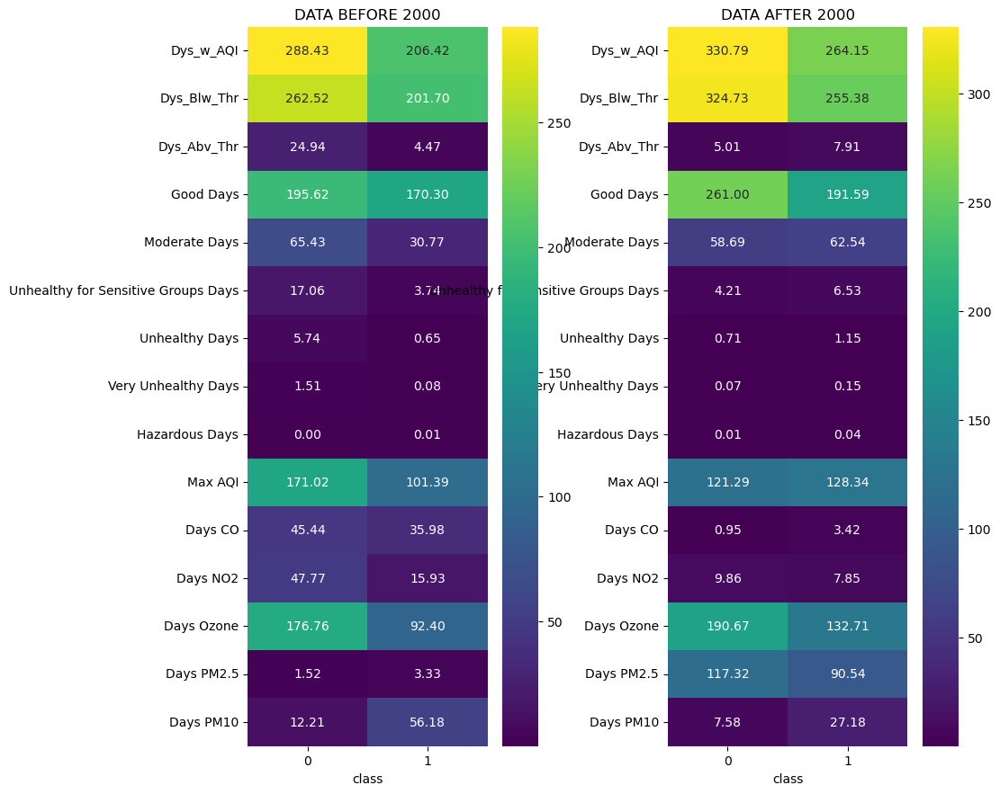

______________________


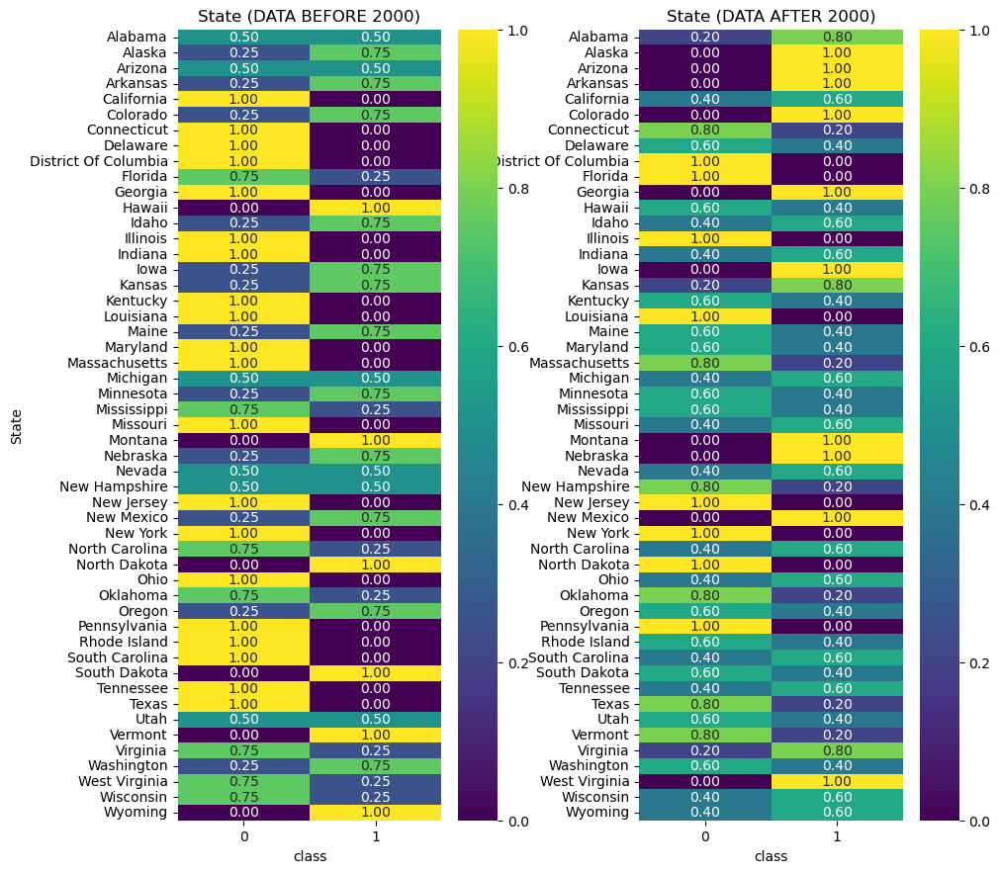

______________________


In [33]:
### Before 2000
### Descaling
class_1 = df_combo1[['class']]
cat_1 = df_combo1[['State', 'Bin', 'Pop_Est']]

df_final1 = pd.concat([cat_1, unscale1, class_1], axis = 1)

### After 2000
class_2 = df_combo2[['class']]
cat_2 = df_combo2[['State', 'Bin', 'Pop_Est']]

df_final2 = pd.concat([cat_2, unscale2, class_2], axis = 1)


fig, axes = plt.subplots(1, 2, figsize=(10,10))
axes = axes.ravel()

col = df_final1.columns[2]
sns.boxplot(x='class', y=col, data=df_final1, ax=axes[0])
axes[0].set_title(f'{col} (DATA BEFORE 2000)')

col = df_final2.columns[2]
sns.boxplot(x='class', y=col, data=df_final2, ax=axes[1])
axes[1].set_title(f'{col} (DATA AFTER 2000)')

plt.subplots_adjust(bottom=0.1)
plt.show()
print('______________________')

fig, axes = plt.subplots(1, 2, figsize=(10,10))

# For df_final1
group1 = df_final1.iloc[:, 3:19]  # Adjust the indices as needed
group1 = group1.groupby('class').mean()
group1 = pd.DataFrame(group1).T  # Transpose
sns.heatmap(group1, annot=True, fmt=".2f", ax=axes[0], cmap='viridis')
axes[0].set_title('DATA BEFORE 2000')

# For df_final2
group2 = df_final2.iloc[:, 3:19]  # Adjust the indices as needed
group2 = group2.groupby('class').mean()
group2 = pd.DataFrame(group2).T  # Transpose
sns.heatmap(group2, annot=True, fmt=".2f", ax=axes[1], cmap='viridis')
axes[1].set_title('DATA AFTER 2000')

plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.4, hspace=0.4)
plt.show()
print('______________________')


for i in range(0,1):
    fig, axes = plt.subplots(1, 2, figsize=(10,10))

    # Use the actual data from df_final1 for the crosstab, not the column name
    col = df_final1.columns[i]
    ctab = pd.crosstab(df_final1[col], df_final1['class'], normalize='index')
    sns.heatmap(ctab, annot=True, fmt=".2f", ax=axes[0], cmap='viridis')
    axes[0].set_title(f'{col} (DATA BEFORE 2000)')

    # Use the actual data from df_final2 for the crosstab
    col = df_final2.columns[i]
    ctab = pd.crosstab(df_final2[col], df_final2['class'], normalize='index')
    sns.heatmap(ctab, annot=True, fmt=".2f", ax=axes[1], cmap='viridis')
    axes[1].set_title(f'{col} (DATA AFTER 2000)')

    plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.4, hspace=0.4)
    plt.show()
    print('______________________')


## 10. Clustering Algorithm #2 - BIRCH


### Parameter Selection

1. Number of Clusters

For determining the number of clusters, we used the Silhouette score being aware of the presence of outliers. We also used the dendogram obtained from birch and the visual inspection of the tSNE plot for each dataframe. Even though the silhouette plot suggest two clusters, the dendogram identifies three main clusters in each case which can be relatively visible in the tSNE plot. Therefore we chose 3 as the number of clusters for BIRCH

2. Cluster Radius

For each dataset we calculated the distance matrix and determined the min, max and median value. We set up as cluster radius a value close to the minimum value, in that way we can try to start grouping observations that are really close one to each other allowing in thie way for the outliers to belong to a specific cluster. For dataset 1 we used 0.4, for dataset 2 we used 0.3

3. Branching Factor

Given that each dataset has a total of 200-210 observations we decided to use a branching factor of 10 which corresponds to aproximately the 0.05% of all the observations. A very large number will provide poor clustering structure, and a very small value will set up clusters as singletons

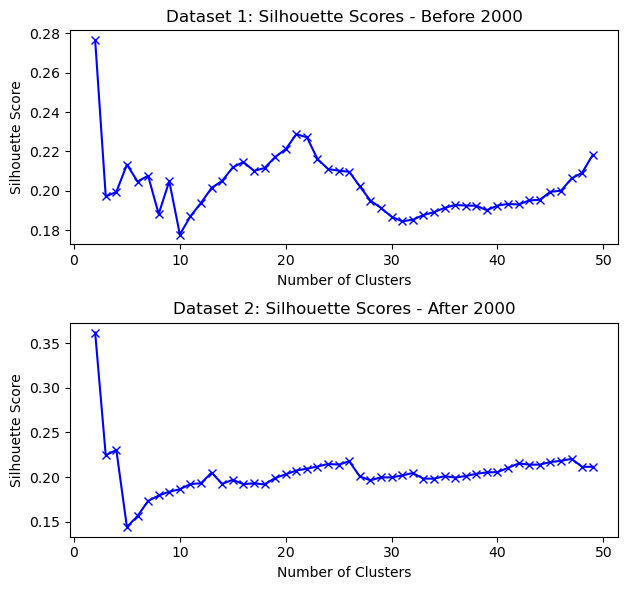

In [34]:
### Number of clusters

silhouette1 = []
wss1 = []

silhouette2 = []
wss2 = []

for i in range(2,50):
    ### Before 2000
    birch = Birch(n_clusters= i, branching_factor=10, threshold= 0.4)
    labels = birch.fit_predict(df1_numerical_scale)
    
    ##silhouette_score
    score = silhouette_score(df1_numerical_scale, labels)
    silhouette1.append(score)
    
    ## After 2000
    birch = Birch(n_clusters= i, branching_factor=10, threshold= 0.3)
    labels = birch.fit_predict(df2_numerical_scale)
    
    ## Silhouette score
    score = silhouette_score(df2_numerical_scale, labels)
    silhouette2.append(score)
    

# Plotting the results
plt.figure(figsize=(12, 6))

range_clusters = range(2,50)

# Silhouette scores for the first dataset
plt.subplot(2, 2, 1)
plt.plot(range_clusters, silhouette1, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Dataset 1: Silhouette Scores - Before 2000')


# Silhouette scores for the second dataset
plt.subplot(2, 2, 3)
plt.plot(range_clusters, silhouette2, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Dataset 2: Silhouette Scores - After 2000')



plt.tight_layout()
plt.show()

    

In [35]:
## Cluster Radius  Before 2000


distance_matrix = squareform(pdist(df1_numerical_scale, 'euclidean'))

# Find min, max, and median values
min_value = np.min(distance_matrix[np.nonzero(distance_matrix)]) # Exclude the diagonal (0 values)
max_value = np.max(distance_matrix)
median_value = np.median(distance_matrix[np.nonzero(distance_matrix)]) # Exclude the diagonal

print("Distance Matrix:\n", distance_matrix)
print("Min Value:", min_value)
print("Max Value:", max_value)
print("Median Value:", median_value)

## Cluster Radius  After 2000

distance_matrix = squareform(pdist(df2_numerical_scale, 'euclidean'))

# Find min, max, and median values
min_value = np.min(distance_matrix[np.nonzero(distance_matrix)]) # Exclude the diagonal (0 values)
max_value = np.max(distance_matrix)
median_value = np.median(distance_matrix[np.nonzero(distance_matrix)]) # Exclude the diagonal

print("Distance Matrix:\n", distance_matrix)
print("Min Value:", min_value)
print("Max Value:", max_value)
print("Median Value:", median_value)
    

Distance Matrix:
 [[0.         1.51362817 5.33480999 ... 7.67059829 5.99940924 6.88208703]
 [1.51362817 0.         5.11550161 ... 7.33143917 5.57821542 6.51910427]
 [5.33480999 5.11550161 0.         ... 2.51971916 2.7263262  3.67565488]
 ...
 [7.67059829 7.33143917 2.51971916 ... 0.         4.21126685 4.46856918]
 [5.99940924 5.57821542 2.7263262  ... 4.21126685 0.         3.36322148]
 [6.88208703 6.51910427 3.67565488 ... 4.46856918 3.36322148 0.        ]]
Min Value: 0.46277518293369746
Max Value: 16.13002087339165
Median Value: 4.449204699504025
Distance Matrix:
 [[0.         1.70101351 2.85816616 ... 4.74757241 5.54725118 6.28811112]
 [1.70101351 0.         2.12991706 ... 4.10528086 4.84891548 5.81864974]
 [2.85816616 2.12991706 0.         ... 3.09261906 3.51585122 4.98531376]
 ...
 [4.74757241 4.10528086 3.09261906 ... 0.         2.1842639  3.52008118]
 [5.54725118 4.84891548 3.51585122 ... 2.1842639  0.         3.15188773]
 [6.28811112 5.81864974 4.98531376 ... 3.52008118 3.151887

### Clustering the data, presenting the data!

By observing the tsne plot:
- It is possible to observe that the algorithm is relatively good by highlighting the clusters that are visible in the tsne plot. Some observations appear far from its real cluster, which emphasize the limitations of using tSNE as a definite tool for assessing clusters. 

- With the dendrogram, it is possible to observe several nested groups within each main cluster. This highlights the advantage of using BIRCH as an algorithm in the sense that it is possible to analyze the nested structure of the whole dataset.


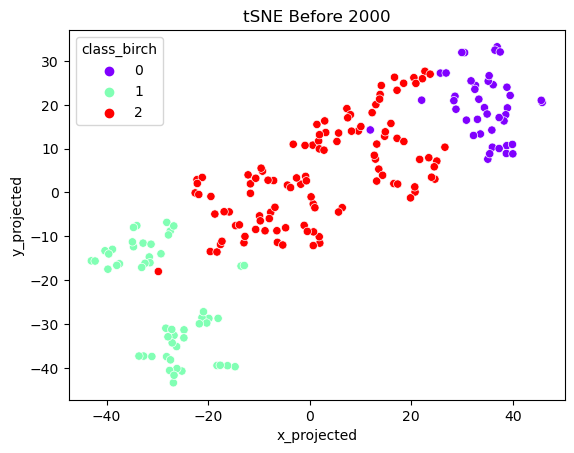

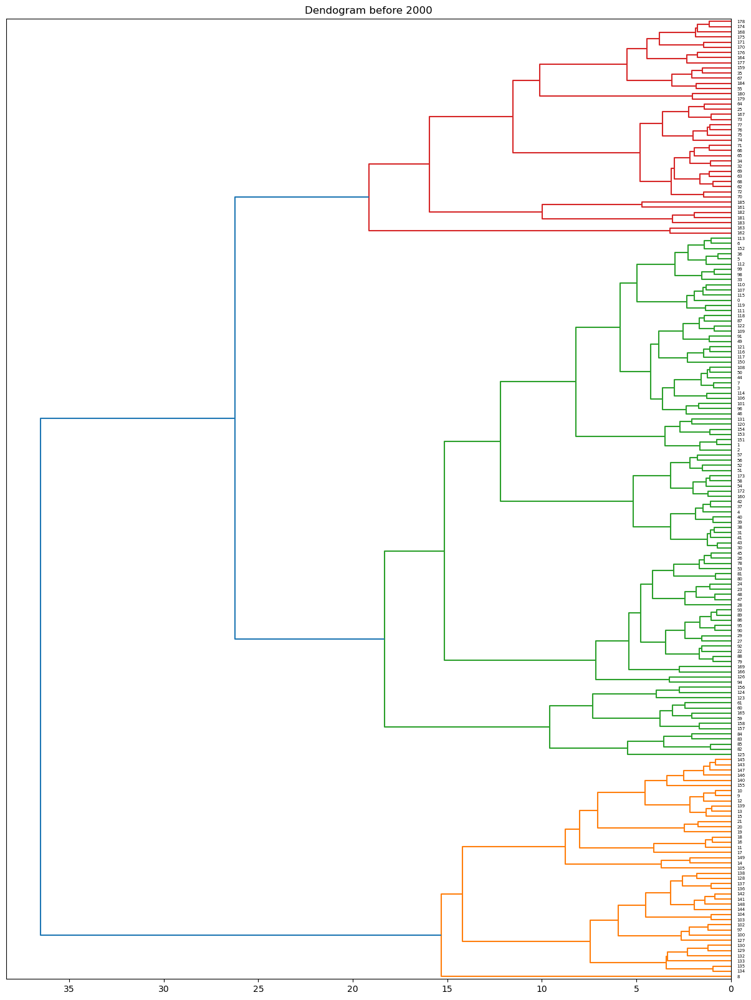

------ Dataset Before 2000


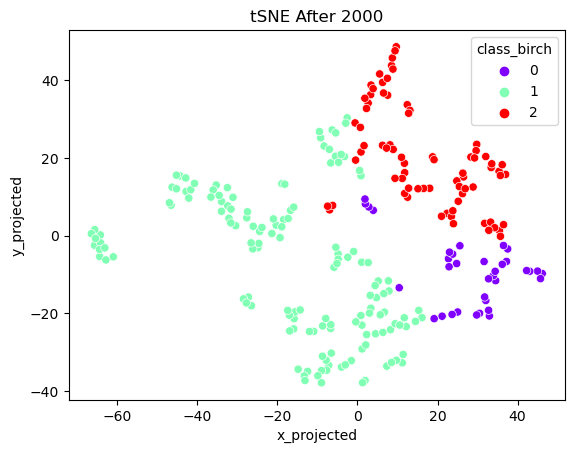

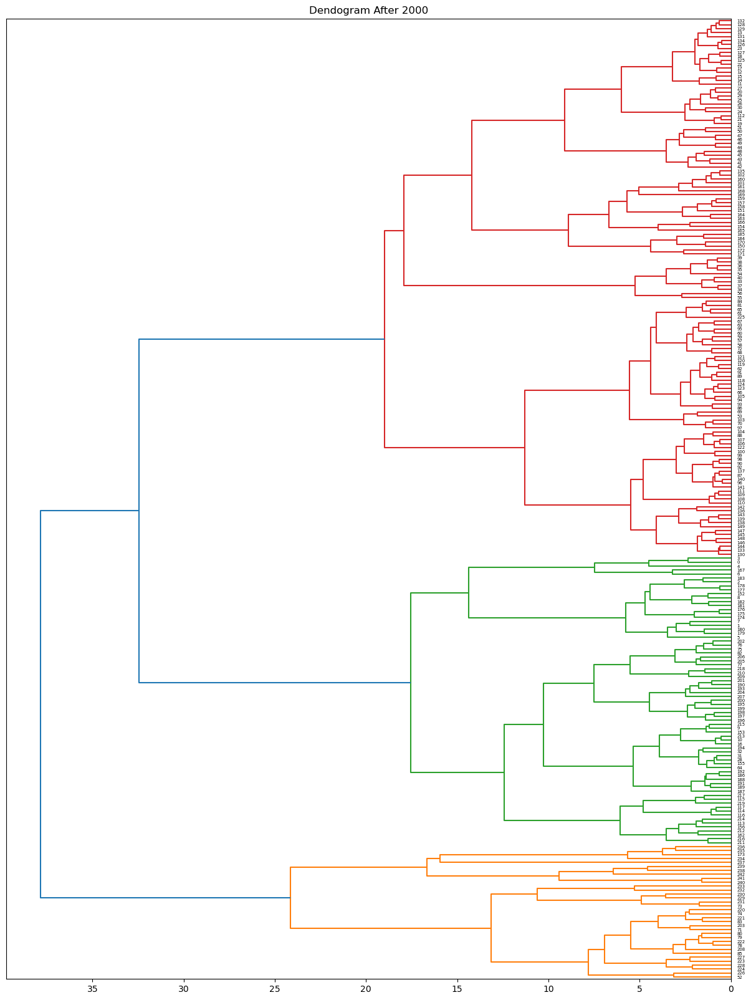

------ - Dataset After 2000


In [44]:

tsne = TSNE(n_components=2, perplexity=8, random_state=250)
data_tsne = tsne.fit_transform(df1_numerical_scale)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_tsne.index = final_df1.index
df_combo1 = pd.concat([final_df1, df_tsne], axis=1) 




tsne = TSNE(n_components=2, perplexity=8, random_state=250)
data_tsne = tsne.fit_transform(df2_numerical_scale)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_tsne.index = final_df2.index
df_combo2 = pd.concat([final_df2, df_tsne], axis=1) 




birch = Birch(n_clusters= 3, branching_factor=10, threshold= 0.4)

### Before 2000
birch.partial_fit(df1_numerical_scale)
df_combo1['class_birch'] = birch.predict(df1_numerical_scale)


sns.scatterplot(x='x_projected', y='y_projected', data=df_combo1, hue='class_birch', palette = 'rainbow')
plt.title('tSNE Before 2000')
plt.show()

centers = birch.subcluster_centers_
Z = linkage(centers, method = 'ward')

plt.figure(figsize = (15,20))
dendrogram(Z, orientation = 'left')
plt.title('Dendogram before 2000')
plt.show()

print("------ Dataset Before 2000")




birch = Birch(n_clusters= 3, branching_factor=10, threshold= 0.3)

### After 2000
birch.partial_fit(df2_numerical_scale)
df_combo2['class_birch'] = birch.predict(df2_numerical_scale)

sns.scatterplot(x='x_projected', y='y_projected', data=df_combo2, hue='class_birch', palette = 'rainbow')
plt.title('tSNE After 2000')
plt.show()

centers = birch.subcluster_centers_
Z = linkage(centers, method = 'ward')

plt.figure(figsize = (15,20))
dendrogram(Z, orientation = 'left')
plt.title('Dendogram After 2000')
plt.show()

print("------ - Dataset After 2000")

### Additional Cluster Exploration

#### Similarity Matrix

Clusters appear to be very close one to each other. Also A failure in our clustering structure is the fact that we have singleton observations. It is clear the presence of outliers in this dataset. The similarity matrix, also talks about the sparsity of the dataset, and first we have clusters that are not balanced in size, second in datasets, observations are relatively closed one to each other within the cluster, but they are not extremely close.

#### Silhouette plot

The silhouette score is negative but close to 0, meaning that the observations are as close as they are to the cluster they belong to as well as the other clusters.

#### Shortcommings

Silhouette plot and similarity matrix could not be the best techniques to assess cohesion and separation for our clusters due to the presence of outliers. In the case of the similarity matrix, the presence of outliers, can opaque the distance between clusters that are closer one to each other. This is the similar case for the silhouette plot. Outliers can significantly skew the silhouette scores because these points might be equally distant from multiple clusters, leading to lower average silhouette scores. Also even though we did the assumption that the clusters are spherical, when looking at the tSNE plots by the clusters assigned, we could observed that this spherical nature is not 100% real, this can impact the usage of the Silhouette plot as a technique for cohesiveness in our clusters.

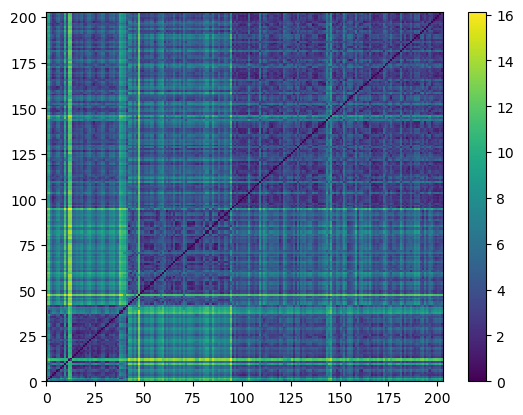

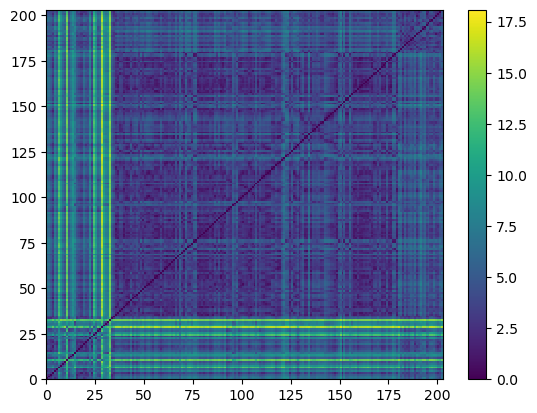

In [45]:
### Before 2000
df_combo1 = df_combo1.sort_values(by = ['class_birch'])
df_sort1 = df_combo1.drop(['State', 'Bin', 'Pop_Est', 'class_birch', 'Year', 'x_projected', 'y_projected'], axis = 1)

dist_mat1 = squareform(pdist(df_sort1))

plt.pcolormesh(dist_mat1, cmap = 'viridis')
plt.colorbar()
N = len(df_combo1)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()



### After 2000

df_combo2 = df_combo2.sort_values(by = ['class_birch'])
df_sort2 = df_combo2.drop(['State', 'Bin', 'Pop_Est', 'class_birch', 'Year', 'x_projected', 'y_projected'], axis = 1)

dist_mat2 = squareform(pdist(df_sort2))

plt.pcolormesh(dist_mat2, cmap = 'viridis')
plt.colorbar()
N = len(df_combo1)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

For n_clusters = 3 The average silhouette_score is : -0.03947506926182384


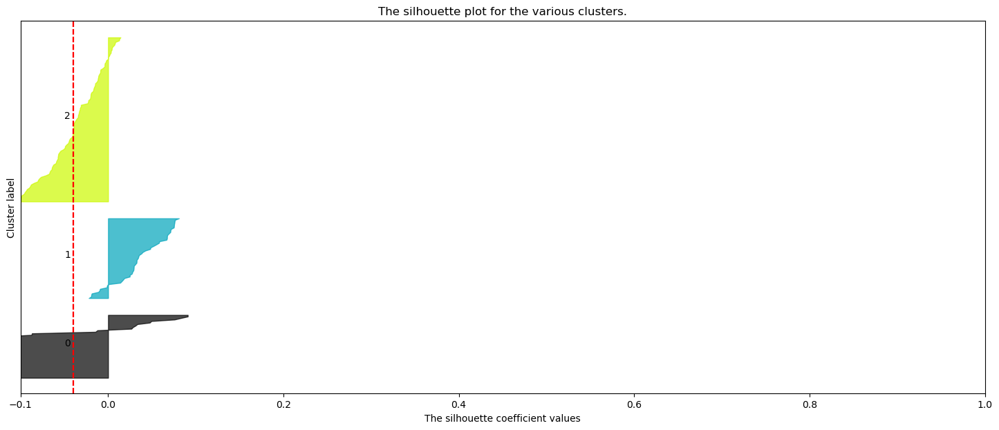

For n_clusters = 3 The average silhouette_score is : -0.03595384025796647


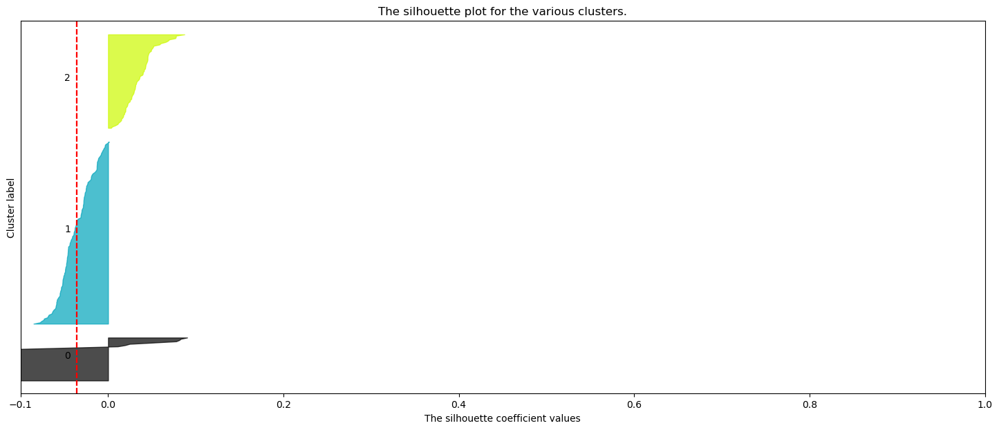

In [48]:
df_labels1 = df_combo1['class_birch']
num1 = df1_numerical_scale
num1 = num1.reset_index()
num1['class_birch'] = df_combo1['class_birch']
num1 = num1.iloc[:,2:18]
show_silhouette_plots(num1, df_labels1)

df_labels2 = df_combo2['class_birch']
num2 = df2_numerical_scale
num2 = num2.reset_index()
num2['class_birch'] = df_combo2['class_birch']
num2 = num2.iloc[:,2:18]
show_silhouette_plots(num2, df_labels2)

#### Cluster Meaningfulness

Our research goal was to describe differences between different periods of time of states when it comes to report habits of AQI and changes in environmental polutants. It is possible to observe that the nature of the clusters might not be the best due to the presence of outliers (if we assess our clusters by the evaluation metrics), still the clusters found are meaningful in the sense that they convey useful information that links states reports with different measures related to AQI report.

#### Cluster Description




Due to the presence of several variables, we decided to display the mean value for each variable within their respective clusters. The analysis, which accounts for the heatmaps provided below, is organized into two time periods: before and after the year 2000.

Before 2000

1. Cluster 1: Features the highest population and AQI reports. Generally high in all variables, likely due to the highest AQI reports per county per state. Includes densely populated states like California, Connecticut, DC, Massachusetts, New Jersey, and Rhode Island, which may explain their tendency for poorer air quality.

2. Cluster 2: Has the lowest population and AQI reports, and generally low in all categories. Notably, it reports the highest number of days with PM10 as the predominant pollutant. This cluster, which could be seen as 'greener,' has limited data reporting. It comprises states like South Dakota, Montana, Wyoming, Alaska, Minnesota, North Dakota, Vermont, and Washington, known for their low population density and comparatively better air quality.

3. Cluster 3: Median in population, and notable for the highest number of days with CO2 as the main pollutant. This cluster includes the majority of observations and states, representing an average state profile.

After 2000

1. Cluster 1: Continues to have the highest population and reports, with the largest number of unhealthy days per year. States like California, Arizona, and DC are included, highlighting a shift in Arizona's status from average to poor AQI.

2. Cluster 2: Median in population and reports the highest number of good air quality days per year. It also has the highest number of days with PM2.5 as the primary pollutant and includes most states.

3. Cluster 3: The lowest in population, this 'green' cluster exhibits low values in all variables, likely due to lower population density. Virginia and Nebraska, previously average, are now prominent in this group, suggesting the effectiveness of environmental policies in these states.

**Overall, the data shows minimal variance between states, but a notable shift in reporting habits post-2000 is evident. Before 2000, Cluster 2 had the lowest mean reporting days (191 days per county), while post-2000, the lowest AQI report was 245 days per county. This change could indicate improved environmental policies or advancements in reporting technologies. The reporting habits of states were quite heterogeneous before 2000, but became more homogeneous afterwards. Additionally, it's important to note the increase in Maximum AQI values and the high number of days with ozone as the main pollutant in all clusters after 2000, compared to the period before.**

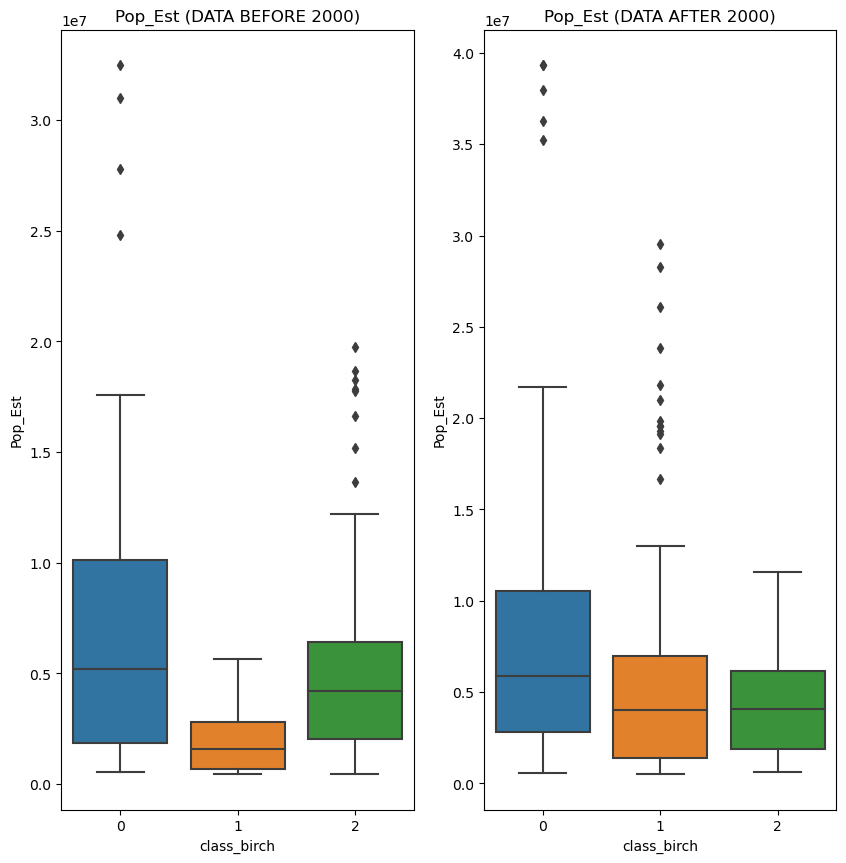

______________________


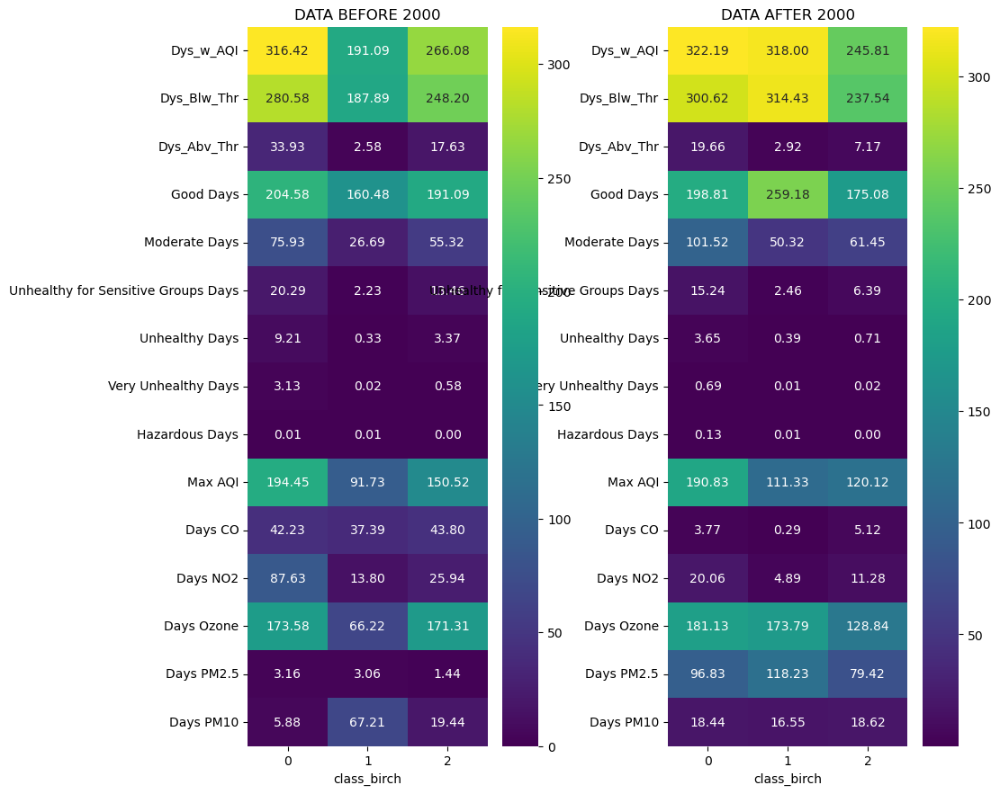

______________________


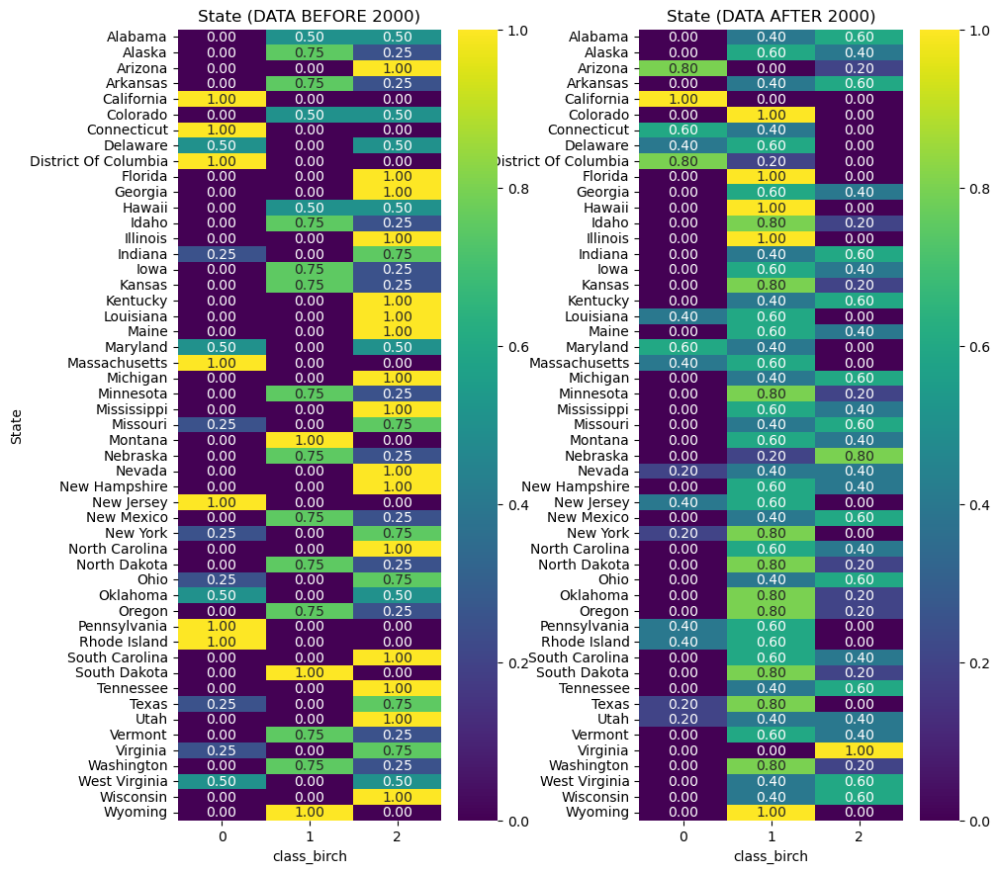

______________________


In [49]:
### Before 2000
### Descaling
class_1 = df_combo1[['class_birch']]
cat_1 = df_combo1[['State', 'Bin', 'Pop_Est']]

df_final1 = pd.concat([cat_1, unscale1, class_1], axis = 1)

### After 2000
class_2 = df_combo2[['class_birch']]
cat_2 = df_combo2[['State', 'Bin', 'Pop_Est']]

df_final2 = pd.concat([cat_2, unscale2, class_2], axis = 1)


fig, axes = plt.subplots(1, 2, figsize=(10,10))  
axes = axes.ravel() 
    
col = df_final1.columns[2]
sns.boxplot(x='class_birch', y=col, data=df_final1, ax=axes[0])
axes[0].set_title(f'{col} (DATA BEFORE 2000)')

col = df_final2.columns[2]
sns.boxplot(x='class_birch', y=col, data=df_final2, ax=axes[1])
axes[1].set_title(f'{col} (DATA AFTER 2000)')
    
plt.subplots_adjust(bottom=0.1)
plt.show()
print('______________________')
    
fig, axes = plt.subplots(1, 2, figsize=(10,10))

# For df_final1
group1 = df_final1.iloc[:, 3:19]  # Adjust the indices as needed
group1 = group1.groupby('class_birch').mean()
group1 = pd.DataFrame(group1).T  # Transpose
sns.heatmap(group1, annot=True, fmt=".2f", ax=axes[0], cmap='viridis')
axes[0].set_title('DATA BEFORE 2000')

# For df_final2
group2 = df_final2.iloc[:, 3:19]  # Adjust the indices as needed
group2 = group2.groupby('class_birch').mean()
group2 = pd.DataFrame(group2).T  # Transpose
sns.heatmap(group2, annot=True, fmt=".2f", ax=axes[1], cmap='viridis')
axes[1].set_title('DATA AFTER 2000')

plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.4, hspace=0.4)
plt.show()
print('______________________')

    
for i in range(0,1):
    fig, axes = plt.subplots(1, 2, figsize=(10,10))  
    
    # Use the actual data from df_final1 for the crosstab, not the column name
    col = df_final1.columns[i]
    ctab = pd.crosstab(df_final1[col], df_final1['class_birch'], normalize='index')
    sns.heatmap(ctab, annot=True, fmt=".2f", ax=axes[0], cmap='viridis')
    axes[0].set_title(f'{col} (DATA BEFORE 2000)')
    
    # Use the actual data from df_final2 for the crosstab
    col = df_final2.columns[i]
    ctab = pd.crosstab(df_final2[col], df_final2['class_birch'], normalize='index')
    sns.heatmap(ctab, annot=True, fmt=".2f", ax=axes[1], cmap='viridis')
    axes[1].set_title(f'{col} (DATA AFTER 2000)')
    
    plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.4, hspace=0.4)
    plt.show()
    print('______________________')
    

## 11. Discussion

The results were different with using K-Medoids and BIRCH. With BIRCH, we were able to distinguish a higher number of clusters compared to K-Medoids, where we were only able to show the presence of 2 clusters. We feel that BIRCH is a better algorithm since it aligned better with our dataset at it is more versatile that K-Medoids when handling observations. Given that for each algorithm we used different number of clusters, measurring an adjusted rand score is not reasonable. The main difference comes from the way that the number of clusters was determined which is a very subjective value to choose, statistics such as the silhouette score, work properly unders some specific assumptions and the presence of outliers impact significantly these assumptions. 

In general both clustering algorithms can provide significant insights. K Medoids provides only two groups which can make interpretation easier compared to BIRCH, but if a more detailed information is desired BIRCH can provide this type of information. It is likely that K-medoids handled outliers better than BIRCH based on the distance matrix computed. Due to the fact that BIRCH provided more clusters than K Medoids it is possible to obtain a finer resolution and variation that K-Medoids might have overlooked by merging data points into the two broader clusters. Furthermore, the higher number of clusters revealed by BIRCH can unveil complex trends or variations across states that might have been unclear in the K-Medoids algorithm, as it clustered the data in a more aggregated approach. Therefore, BIRCH was able to lead to better insights into how different states handle environmental issues and we believe that this algorithm is more useful when comparing the AQI index for different states over periods of time.

## 12. Conclusion

This project provides an extensive overview of the Air Quality Index (AQI) values that have been reported in different U.S. states between 1980 and 2022.Through our analysis, we went through basic data cleaning, seperating our dataset into two parts to observe data before and after 2000, analyzing our clusters through K-Medoids and BIRCH, and finally, related our overall research question to our findings. This assessment looks at the reporting habbits of states over the years in data related to AQI, it is useful to understand general trendings in reportage as well as changes in AQI in states by measuring parameters such as Total number of healty or hazardous days. These assessments have the potential to assist the public in making well-informed decisions about ideal home locations and provide useful information to policymakers for the creation of legislation that improve air quality. We believe that the insights provided by the BIRCH algorithm was most meaniingful to our research motivation, as it was able to compare AQI over various states and more distinct clusters. This can show the variations in AQI health over more locations as well as time periods. While our clustering algorithms did show important information, there were some shortcomings with both algorithms. A big shortcomming is the lack of knowledge in the total number of clusters in the dataset, another shortcomming is the presence of outliers which limits the type of algorithms optimal for usage. Moreover the shape of the clusters in the original dataset also limits the overall performance of our algorithms along with the presence of noise. Furthermore, BIRCH may cause for over splitting of the clusters, resulting in the clusters to be too specific and may lead to to clusters with minimal distinctiveness. If we were to continue working on this project and further analyze this dataset, we would work more towards finding other ways to clean our data in order to have the best possible dataset to cluster. We feel that by doing this, our clustering algorithms would be more cohesive and be able to reveal more about the AQI index over various states and time periods. It is important to emphasize the need to perform proper data cleaning and manipulation before any statistical analysis, this ensure good results and better interpretability. More importantly, a deeper understanding in the topic is needed.

## References

Centers for Disease Control and Prevention. (n.d.). Air Quality. Retrieved from https://www.cdc.gov/air/default.htm

Johns Hopkins University. (2021). Effects of temperature and humidity on the spread of COVID-19: A systematic review. PLOS ONE, 16(1), e0245254. https://doi.org/10.1371/journal.pone.0245254

Rodriguez-Morales, A. J., Bonilla-Aldana, D. K., Tiwari, R., Sah, R., Rabaan, A. A., & Dhama, K. (2020). COVID-19, an emerging coronavirus infection: Current scenario and recent developments - An overview. Journal of Pure and Applied Microbiology, 14(1), 53-56. https://doi.org/10.22207/JPAM.14.1.02